In [1]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer

# Read the dataset
df = pd.read_csv('datasets/kurla.csv')



In [2]:
def plot_missing_values(df, title):
    plt.figure(figsize=(15, 6))
    sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
    plt.title(title)
    plt.show()
    
    # Calculate percentage of missing values
    missing_percentage = (df.isnull().sum() / len(df)) * 100
    plt.figure(figsize=(15, 6))
    missing_percentage.plot(kind='bar')
    plt.title('Percentage of Missing Values by Column')
    plt.ylabel('Percentage')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [3]:
print("Before handling missing values:")
print("\nMissing values count:")
print(df.isnull().sum())
print("\nPercentage of missing values:")
print((df.isnull().sum() / len(df)) * 100)

Before handling missing values:

Missing values count:
Unnamed: 0         0
From Date          0
To Date            0
PM2.5           6173
PM10            8199
NO              7189
NO2             7156
NOx             7182
NH3             7165
SO2             8668
CO              8486
Ozone           8886
Benzene         6551
Toluene        17376
Eth-Benzene     9269
MP-Xylene       9389
RH              7531
WS              7531
WD              7531
SR             12389
BP             17034
AT              7692
TOT-RF             0
dtype: int64

Percentage of missing values:
Unnamed: 0       0.000000
From Date        0.000000
To Date          0.000000
PM2.5           35.526013
PM10            47.185773
NO              41.373158
NO2             41.183241
NOx             41.332873
NH3             41.235037
SO2             49.884899
CO              48.837477
Ozone           51.139503
Benzene         37.701427
Toluene        100.000000
Eth-Benzene     53.343692
MP-Xylene       54.034300
RH

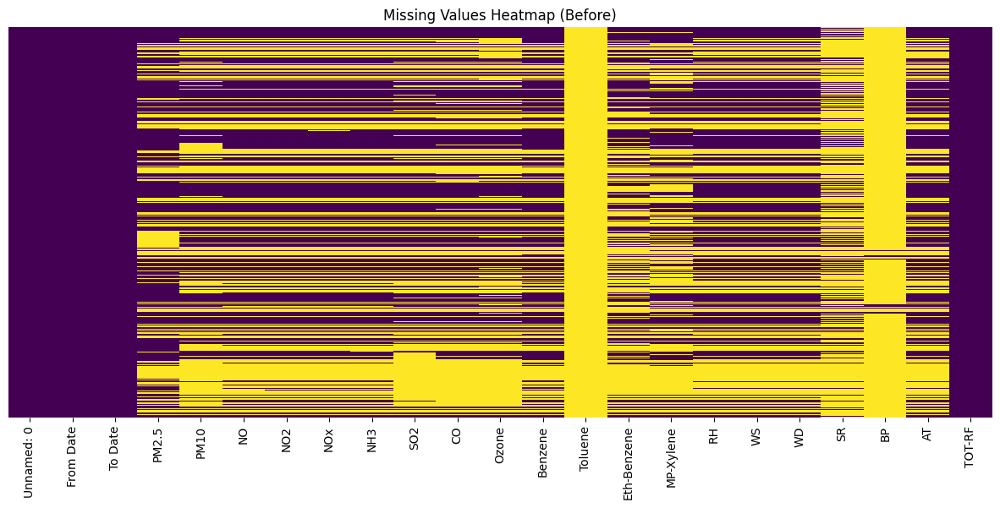

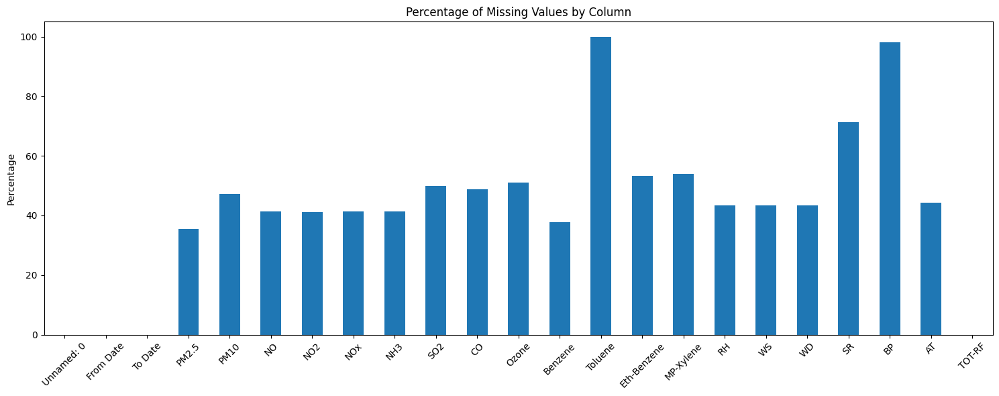

In [4]:
plot_missing_values(df, 'Missing Values Heatmap (Before)')

# Handle missing values
df_cleaned = df.copy()

In [5]:
import pandas as pd

# Read the original CSV file
df = pd.read_csv('./datasets/kurla.csv')

# List of columns to remove
columns_to_remove = ['SO2', 'CO', 'Toluene', 'BP', 'SR', 'AT']

# Drop the specified columns
df_cleaned = df.drop(columns=columns_to_remove)

# Save the cleaned dataset
df_cleaned.to_csv('kurla_cleaned.csv', index=False)

print("Columns removed successfully!")
print("\nRemaining columns:", df_cleaned.columns.tolist())

Columns removed successfully!

Remaining columns: ['Unnamed: 0', 'From Date', 'To Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'Ozone', 'Benzene', 'Eth-Benzene', 'MP-Xylene', 'RH', 'WS', 'WD', 'TOT-RF']


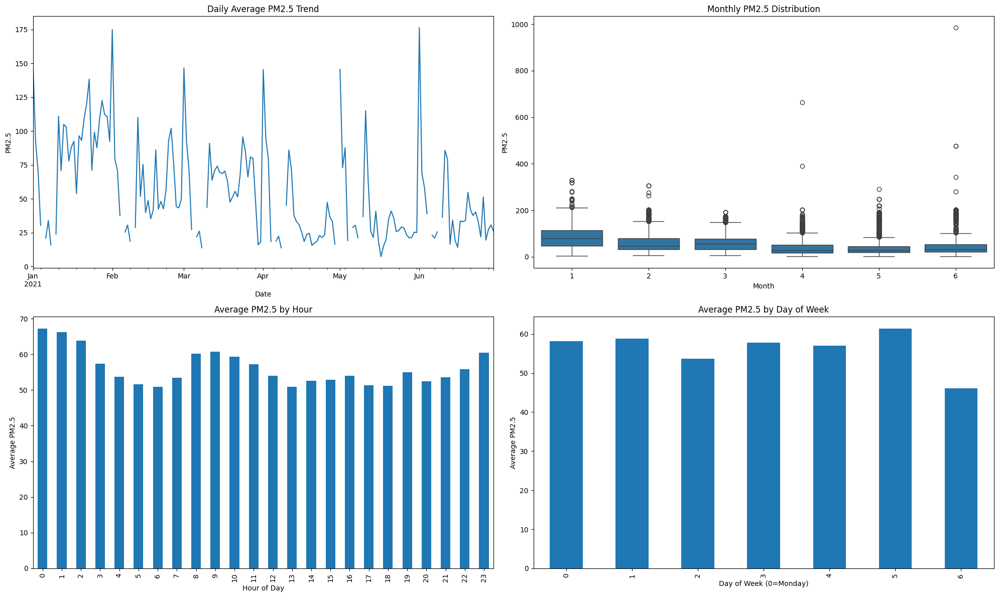

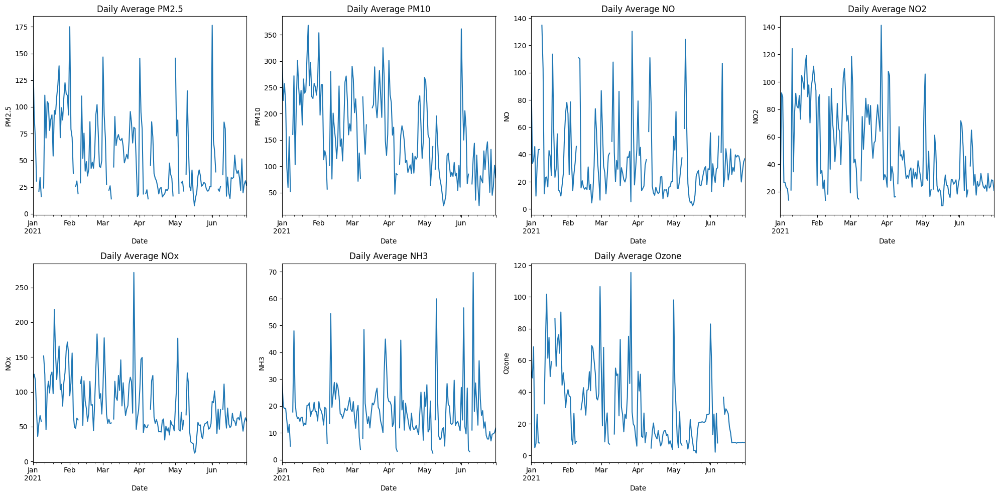


Seasonal Statistics for PM2.5:
             mean        std  min    max
season                                  
Winter  68.808326  44.766390  4.0  330.0
Spring  42.974005  42.732903  1.0  985.0
Summer        NaN        NaN  NaN    NaN
Fall          NaN        NaN  NaN    NaN


C:\Users\kunal\AppData\Local\Temp\ipykernel_22216\1396079254.py:70: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_stats = df.groupby('season')['PM2.5'].agg(['mean', 'std', 'min', 'max'])


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Read the data
df = pd.read_csv('./datasets/kurla.csv')

# Convert 'From Date' to datetime
df['From Date'] = pd.to_datetime(df['From Date'])

# Set the datetime as index
df.set_index('From Date', inplace=True)

# Create a figure with multiple subplots
plt.figure(figsize=(20, 12))

# 1. Daily Average Trend
plt.subplot(2, 2, 1)
daily_avg = df['PM2.5'].resample('D').mean()
daily_avg.plot(title='Daily Average PM2.5 Trend')
plt.xlabel('Date')
plt.ylabel('PM2.5')

# 2. Monthly Box Plot for Seasonality
plt.subplot(2, 2, 2)
df['month'] = df.index.month
sns.boxplot(x='month', y='PM2.5', data=df)
plt.title('Monthly PM2.5 Distribution')
plt.xlabel('Month')
plt.ylabel('PM2.5')

# 3. Hourly Pattern
plt.subplot(2, 2, 3)
df['hour'] = df.index.hour
hourly_avg = df.groupby('hour')['PM2.5'].mean()
hourly_avg.plot(kind='bar', title='Average PM2.5 by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Average PM2.5')

# 4. Weekly Pattern
plt.subplot(2, 2, 4)
df['dayofweek'] = df.index.dayofweek
weekly_avg = df.groupby('dayofweek')['PM2.5'].mean()
weekly_avg.plot(kind='bar', title='Average PM2.5 by Day of Week')
plt.xlabel('Day of Week (0=Monday)')
plt.ylabel('Average PM2.5')

plt.tight_layout()
plt.show()

# Additional analysis for other pollutants
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'Ozone']

plt.figure(figsize=(20, 10))
for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(2, 4, i)
    df[pollutant].resample('D').mean().plot(title=f'Daily Average {pollutant}')
    plt.xlabel('Date')
    plt.ylabel(pollutant)

plt.tight_layout()
plt.show()

# Print seasonal statistics
print("\nSeasonal Statistics for PM2.5:")
df['season'] = pd.cut(df.index.month, 
                     bins=[0, 3, 6, 9, 12], 
                     labels=['Winter', 'Spring', 'Summer', 'Fall'])
seasonal_stats = df.groupby('season')['PM2.5'].agg(['mean', 'std', 'min', 'max'])
print(seasonal_stats)

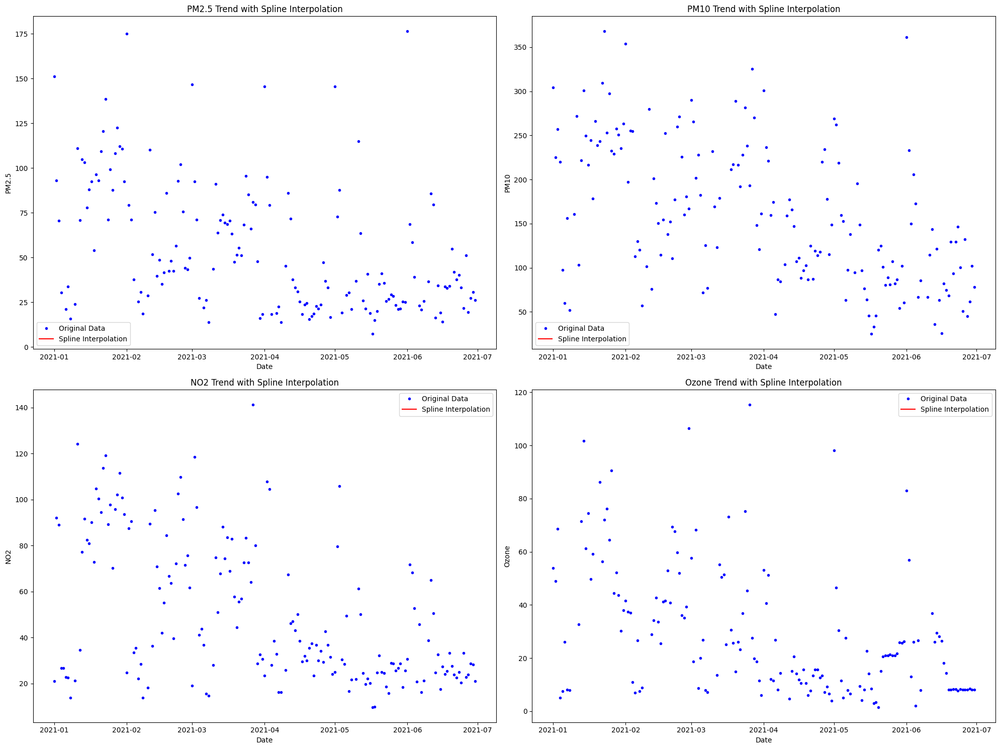

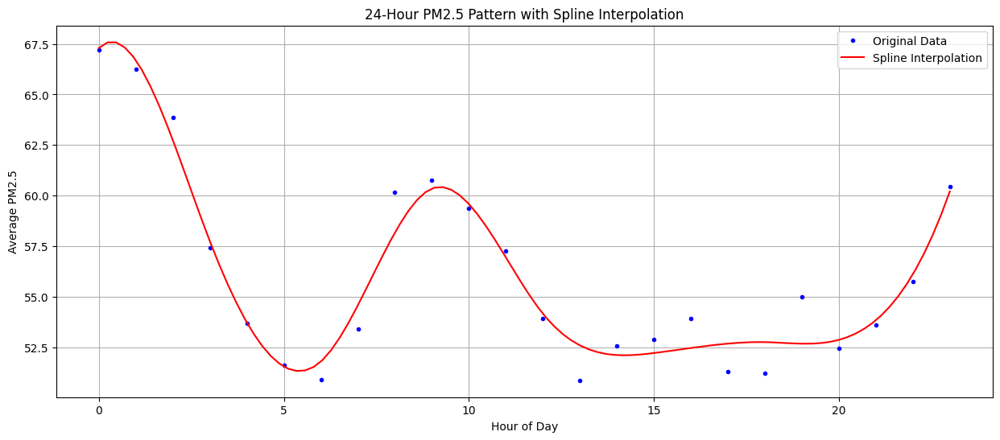

In [8]:
import pandas as pd
import numpy as np
from scipy.interpolate import UnivariateSpline
import matplotlib.pyplot as plt
from datetime import datetime

# Read the data
df = pd.read_csv('./datasets/kurla.csv')
df['From Date'] = pd.to_datetime(df['From Date'])

# Create figure with subplots
plt.figure(figsize=(20, 15))

# 1. PM2.5 Spline Interpolation
plt.subplot(2, 2, 1)
daily_pm25 = df.groupby(df['From Date'].dt.date)['PM2.5'].mean().reset_index()
x = np.arange(len(daily_pm25))
dates_array = np.array(daily_pm25['From Date'])
pm25_array = np.array(daily_pm25['PM2.5'])
spl = UnivariateSpline(x, pm25_array, k=3, s=len(daily_pm25))
plt.plot(dates_array, pm25_array, 'b.', label='Original Data')
plt.plot(dates_array, spl(x), 'r-', label='Spline Interpolation')
plt.title('PM2.5 Trend with Spline Interpolation')
plt.xlabel('Date')
plt.ylabel('PM2.5')
plt.legend()

# 2. PM10 Spline Interpolation
plt.subplot(2, 2, 2)
daily_pm10 = df.groupby(df['From Date'].dt.date)['PM10'].mean().reset_index()
x = np.arange(len(daily_pm10))
dates_array = np.array(daily_pm10['From Date'])
pm10_array = np.array(daily_pm10['PM10'])
spl = UnivariateSpline(x, pm10_array, k=3, s=len(daily_pm10))
plt.plot(dates_array, pm10_array, 'b.', label='Original Data')
plt.plot(dates_array, spl(x), 'r-', label='Spline Interpolation')
plt.title('PM10 Trend with Spline Interpolation')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()

# 3. NO2 Spline Interpolation
plt.subplot(2, 2, 3)
daily_no2 = df.groupby(df['From Date'].dt.date)['NO2'].mean().reset_index()
x = np.arange(len(daily_no2))
dates_array = np.array(daily_no2['From Date'])
no2_array = np.array(daily_no2['NO2'])
spl = UnivariateSpline(x, no2_array, k=3, s=len(daily_no2))
plt.plot(dates_array, no2_array, 'b.', label='Original Data')
plt.plot(dates_array, spl(x), 'r-', label='Spline Interpolation')
plt.title('NO2 Trend with Spline Interpolation')
plt.xlabel('Date')
plt.ylabel('NO2')
plt.legend()

# 4. Ozone Spline Interpolation
plt.subplot(2, 2, 4)
daily_ozone = df.groupby(df['From Date'].dt.date)['Ozone'].mean().reset_index()
x = np.arange(len(daily_ozone))
dates_array = np.array(daily_ozone['From Date'])
ozone_array = np.array(daily_ozone['Ozone'])
spl = UnivariateSpline(x, ozone_array, k=3, s=len(daily_ozone))
plt.plot(dates_array, ozone_array, 'b.', label='Original Data')
plt.plot(dates_array, spl(x), 'r-', label='Spline Interpolation')
plt.title('Ozone Trend with Spline Interpolation')
plt.xlabel('Date')
plt.ylabel('Ozone')
plt.legend()

plt.tight_layout()
plt.show()

# Additional visualization for hourly patterns with spline
plt.figure(figsize=(15, 6))
hourly_pm25 = df.groupby(df['From Date'].dt.hour)['PM2.5'].mean()
x = np.arange(24)
spl = UnivariateSpline(x, hourly_pm25.values, k=3, s=len(hourly_pm25))
x_fine = np.linspace(0, 23, 100)
plt.plot(x, hourly_pm25.values, 'b.', label='Original Data')
plt.plot(x_fine, spl(x_fine), 'r-', label='Spline Interpolation')
plt.title('24-Hour PM2.5 Pattern with Spline Interpolation')
plt.xlabel('Hour of Day')
plt.ylabel('Average PM2.5')
plt.legend()
plt.grid(True)
plt.show()

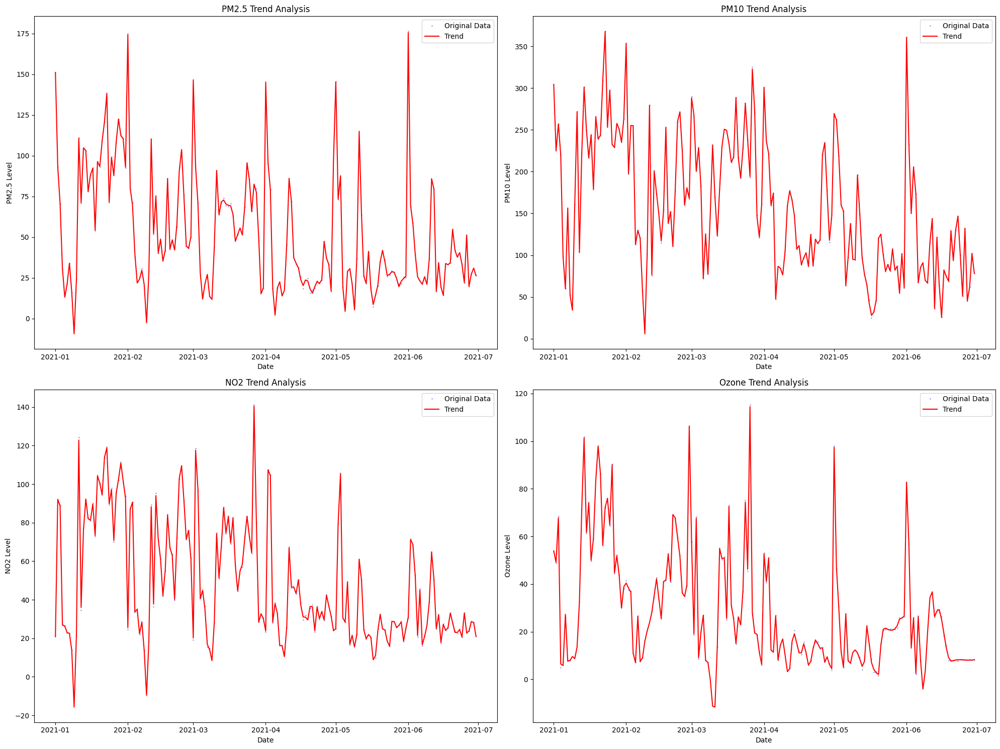

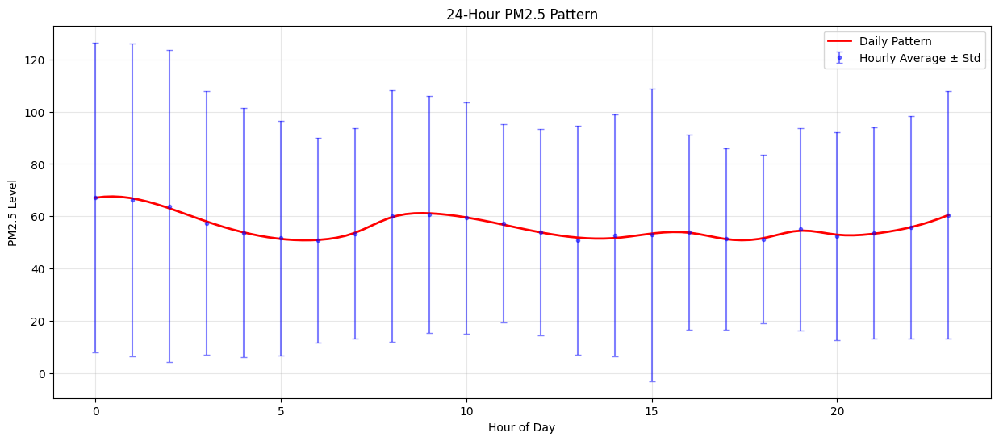

In [13]:
import pandas as pd
import numpy as np
from scipy.interpolate import UnivariateSpline
import matplotlib.pyplot as plt
from datetime import datetime

# Read the data
df = pd.read_csv('./datasets/kurla.csv')
df['From Date'] = pd.to_datetime(df['From Date'])

# Create figure with subplots
plt.figure(figsize=(20, 15))

def plot_spline(ax, data, dates, pollutant, smoothing=0.5):
    mask = ~np.isnan(data)
    x_valid = np.arange(len(data))[mask]
    spl = UnivariateSpline(x_valid, data[mask], k=3, s=smoothing*len(x_valid))
    x_full = np.arange(len(data))
    ax.plot(dates, data, 'b.', alpha=0.3, markersize=2, label='Original Data')
    ax.plot(dates, spl(x_full), 'r-', linewidth=1.5, label='Trend')
    ax.set_title(f'{pollutant} Trend Analysis')
    ax.set_xlabel('Date')
    ax.set_ylabel(f'{pollutant} Level')
    ax.legend()

# Calculate daily averages
daily_data = df.groupby(df['From Date'].dt.date).agg({
    'PM2.5': 'mean',
    'PM10': 'mean',
    'NO2': 'mean',
    'Ozone': 'mean'
}).reset_index()

# Plot each pollutant
pollutants = ['PM2.5', 'PM10', 'NO2', 'Ozone']
smoothing_factors = [0.5, 0.5, 0.3, 0.3]  # Adjusted for each pollutant

for i, (pollutant, smooth) in enumerate(zip(pollutants, smoothing_factors), 1):
    ax = plt.subplot(2, 2, i)
    plot_spline(ax, 
                np.array(daily_data[pollutant]),
                np.array(daily_data['From Date']),
                pollutant,
                smoothing=smooth)

plt.tight_layout()
plt.show()

# Hourly pattern with improved spline
plt.figure(figsize=(15, 6))
hourly_data = df.groupby(df['From Date'].dt.hour)['PM2.5'].agg(['mean', 'std']).reset_index()
x = np.arange(24)
y = hourly_data['mean'].values

spl = UnivariateSpline(x, y, k=3, s=5)  # Reduced smoothing for hourly pattern
x_fine = np.linspace(0, 23, 100)

plt.errorbar(x, y, yerr=hourly_data['std'].values, 
            fmt='b.', capsize=3, alpha=0.5, label='Hourly Average ± Std')
plt.plot(x_fine, spl(x_fine), 'r-', linewidth=2, label='Daily Pattern')
plt.title('24-Hour PM2.5 Pattern')
plt.xlabel('Hour of Day')
plt.ylabel('PM2.5 Level')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

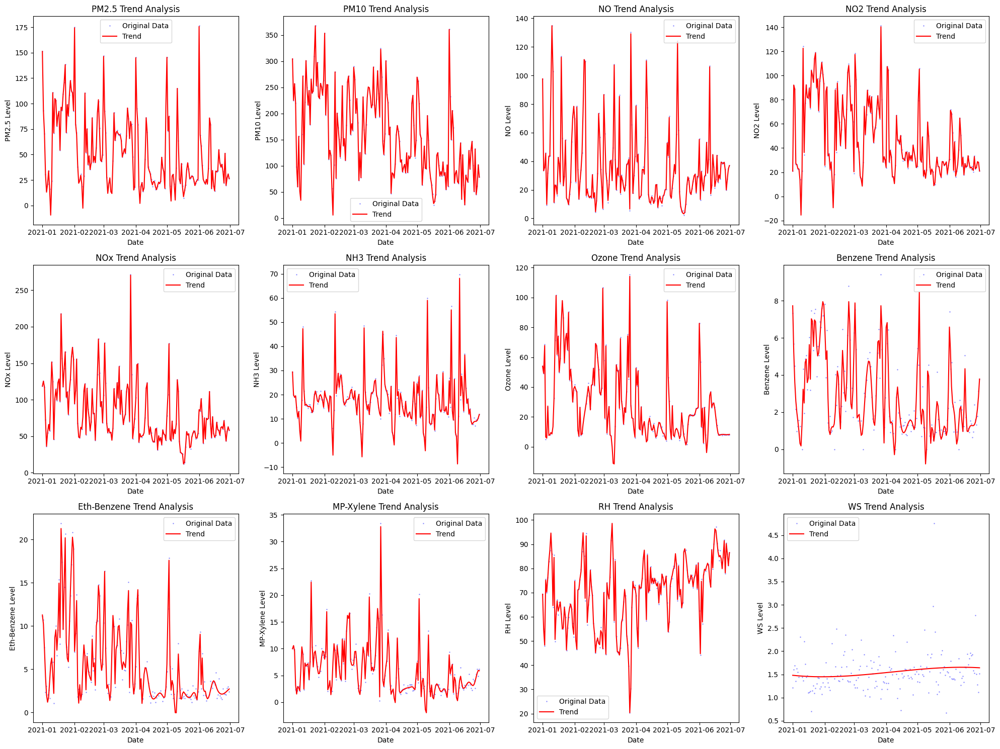

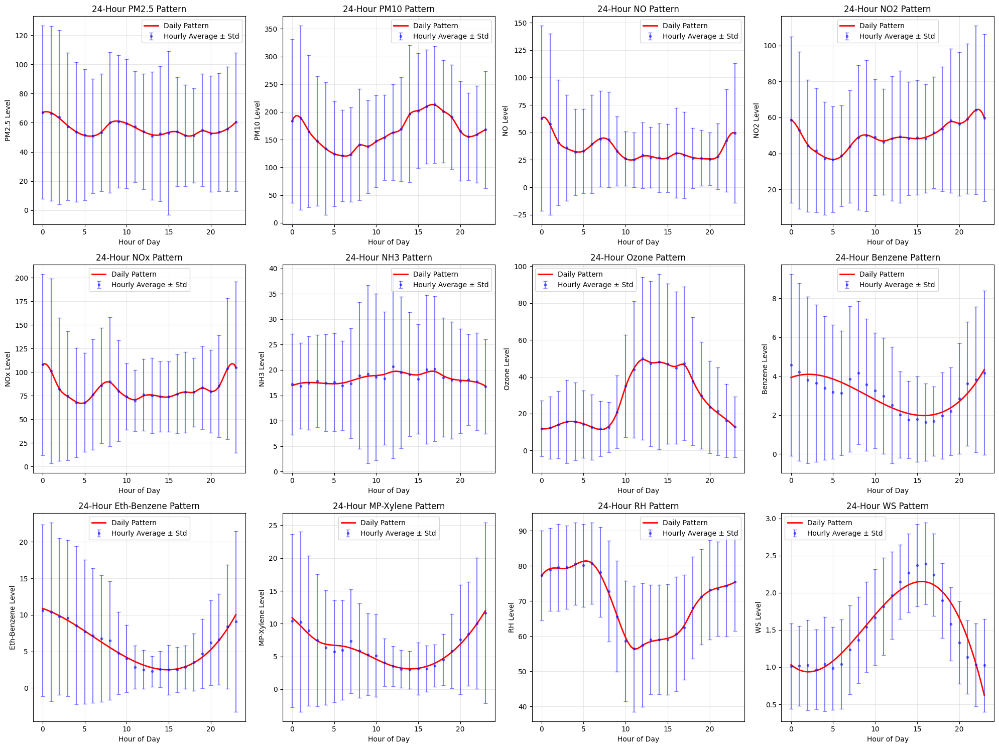

In [ ]:
import pandas as pd
import numpy as np
from scipy.interpolate import UnivariateSpline
import matplotlib.pyplot as plt
from datetime import datetime

# Read the data
df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla.csv')
df['From Date'] = pd.to_datetime(df['From Date'])

# Drop WD and TOT-RF columns
df = df.drop(['WD', 'TOT-RF'], axis=1)

# Create weekly and monthly columns
df['Week'] = df['From Date'].dt.isocalendar().week
df['Month'] = df['From Date'].dt.month
df['Year'] = df['From Date'].dt.year

# List of all pollutants and environmental factors
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'Ozone', 
              'Benzene', 'Eth-Benzene', 'MP-Xylene', 'RH', 'WS']

# Calculate daily, weekly and monthly averages
daily_data = df.groupby(df['From Date'].dt.date.astype(str))[pollutants].mean().reset_index()
daily_data['From Date'] = pd.to_datetime(daily_data['From Date'])

weekly_data = df.groupby(['Year', 'Week'])[pollutants].mean().reset_index()
monthly_data = df.groupby(['Year', 'Month'])[pollutants].mean().reset_index()

def plot_spline(ax, data, dates, pollutant, smoothing=0.5):
    mask = ~np.isnan(data)
    x_valid = np.arange(len(data))[mask]
    if len(x_valid) > 0:  # Check if we have valid data
        spl = UnivariateSpline(x_valid, data[mask], k=3, s=smoothing*len(x_valid))
        x_full = np.arange(len(data))
        ax.plot(dates, data, 'b.', alpha=0.3, markersize=2, label='Original Data')
        ax.plot(dates, spl(x_full), 'r-', linewidth=1.5, label='Trend')
    ax.set_title(f'{pollutant} Trend Analysis')
    ax.set_xlabel('Date')
    ax.set_ylabel(f'{pollutant} Level')
    ax.legend()

# Create subplots for each pollutant
n_rows = (len(pollutants) + 3) // 4  # Calculate number of rows needed
plt.figure(figsize=(20, 5*n_rows))

for i, pollutant in enumerate(pollutants, 1):
    ax = plt.subplot(n_rows, 4, i)
    plot_spline(ax,
                np.array(daily_data[pollutant]),
                np.array(daily_data['From Date']),
                pollutant,
                smoothing=0.5)

plt.tight_layout()
plt.show()

# 24-hour patterns for all pollutants
plt.figure(figsize=(20, 15))

for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(3, 4, i)
    hourly_data = df.groupby(df['From Date'].dt.hour)[pollutant].agg(['mean', 'std']).reset_index()
    
    x = np.arange(24)
    y = hourly_data['mean'].values
    
    # Only create spline if we have valid data
    if not np.isnan(y).all():
        spl = UnivariateSpline(x, y, k=3, s=5)
        x_fine = np.linspace(0, 23, 100)
        
        plt.errorbar(x, y, yerr=hourly_data['std'].values,
                    fmt='b.', capsize=3, alpha=0.5, label='Hourly Average ± Std')
        plt.plot(x_fine, spl(x_fine), 'r-', linewidth=2, label='Daily Pattern')
    
    plt.title(f'24-Hour {pollutant} Pattern')
    plt.xlabel('Hour of Day')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Missing Values in Daily Dataset:
PM2.5: 13 values missing (7.18%)
PM10: 11 values missing (6.08%)
NO: 6 values missing (3.31%)
NO2: 6 values missing (3.31%)
NOx: 6 values missing (3.31%)
NH3: 6 values missing (3.31%)
Ozone: 21 values missing (11.60%)
Benzene: 6 values missing (3.31%)
Eth-Benzene: 14 values missing (7.73%)
MP-Xylene: 14 values missing (7.73%)
RH: 7 values missing (3.87%)
WS: 7 values missing (3.87%)

Missing Values in Monthly Dataset:

Missing Values in Weekly Dataset:


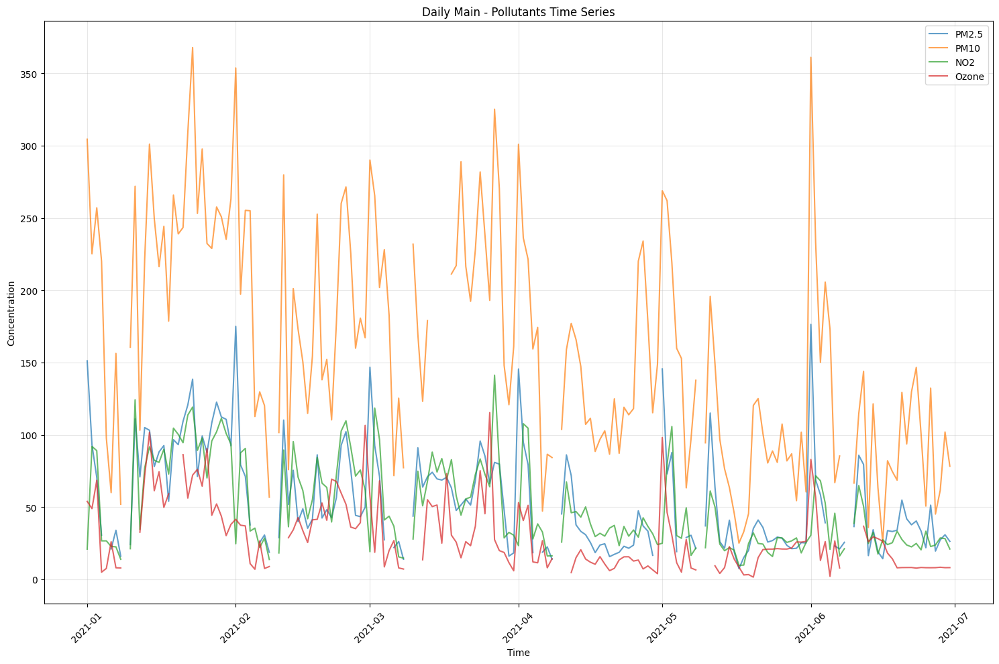

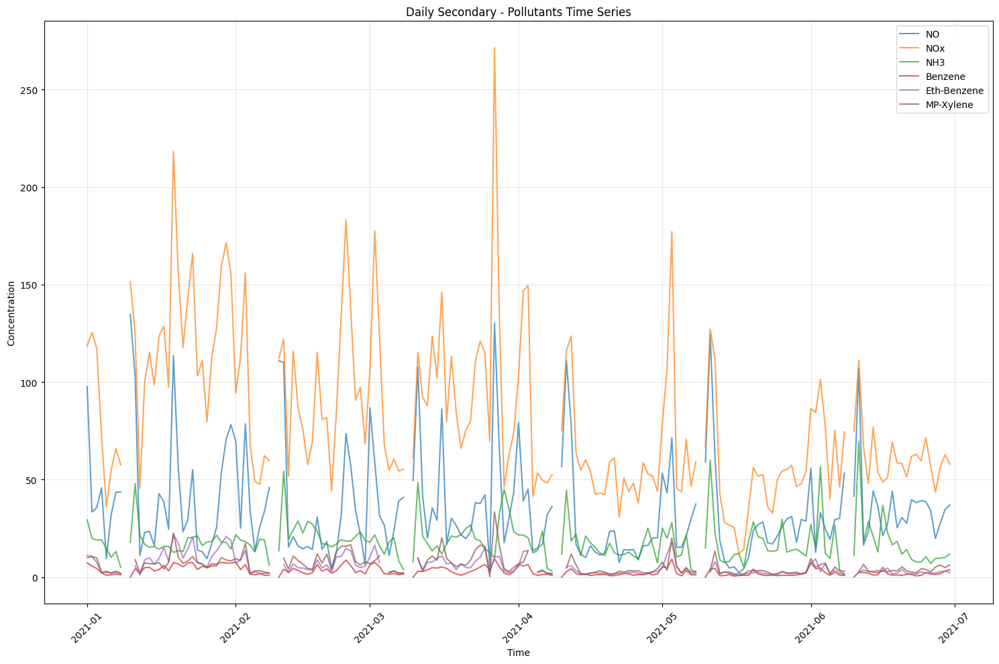

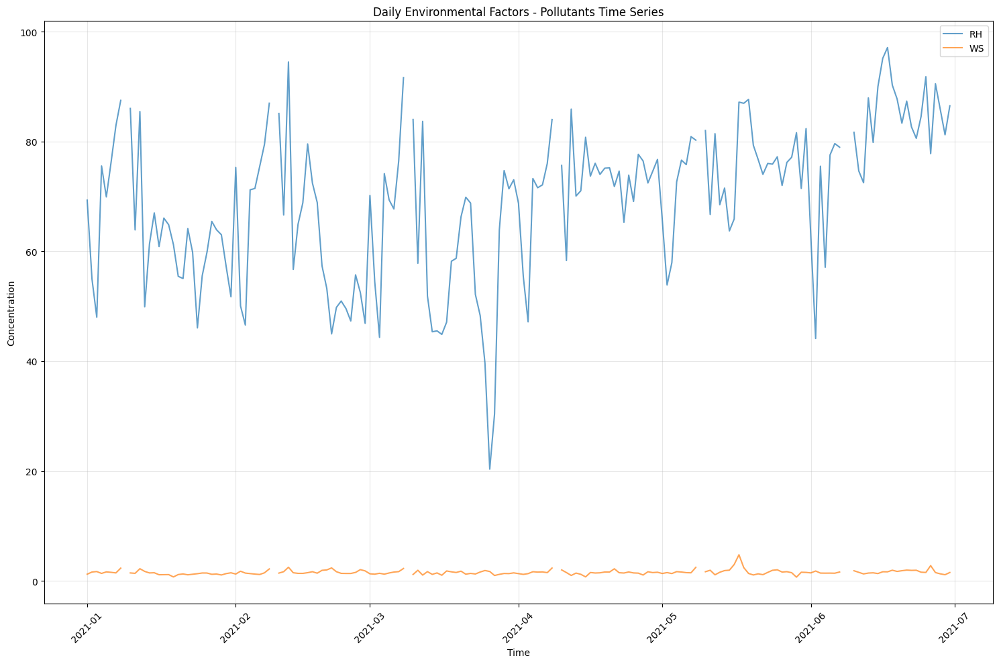

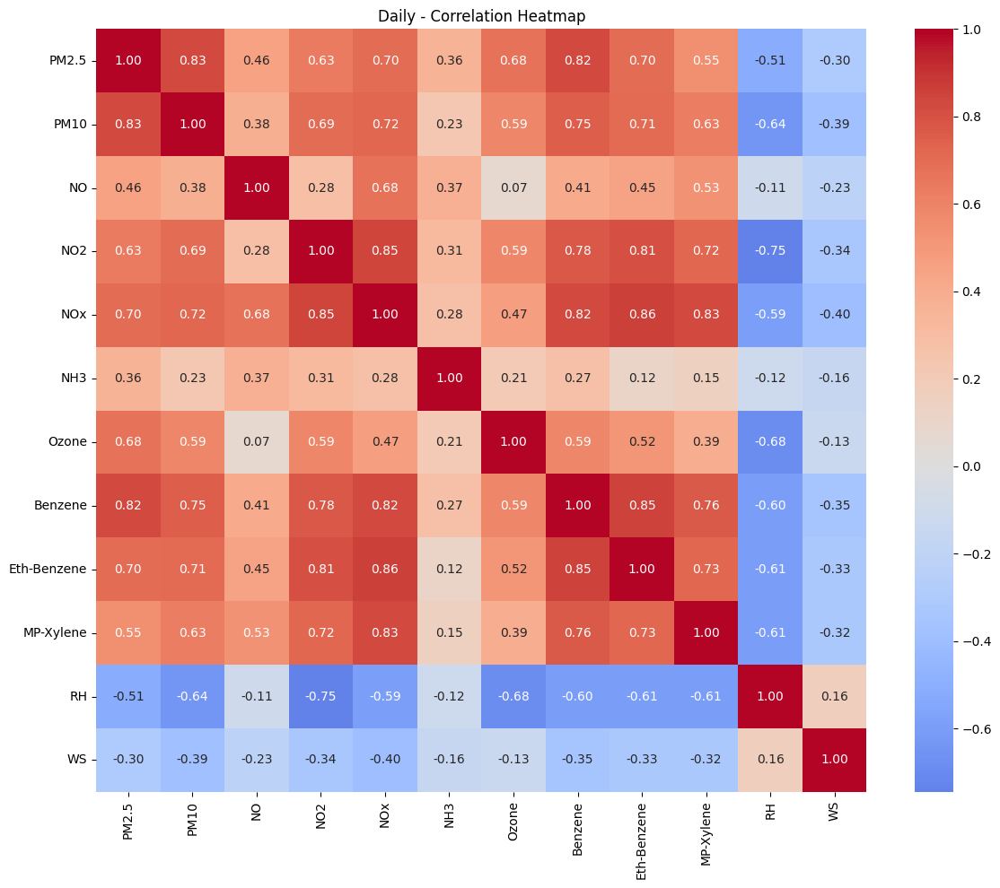

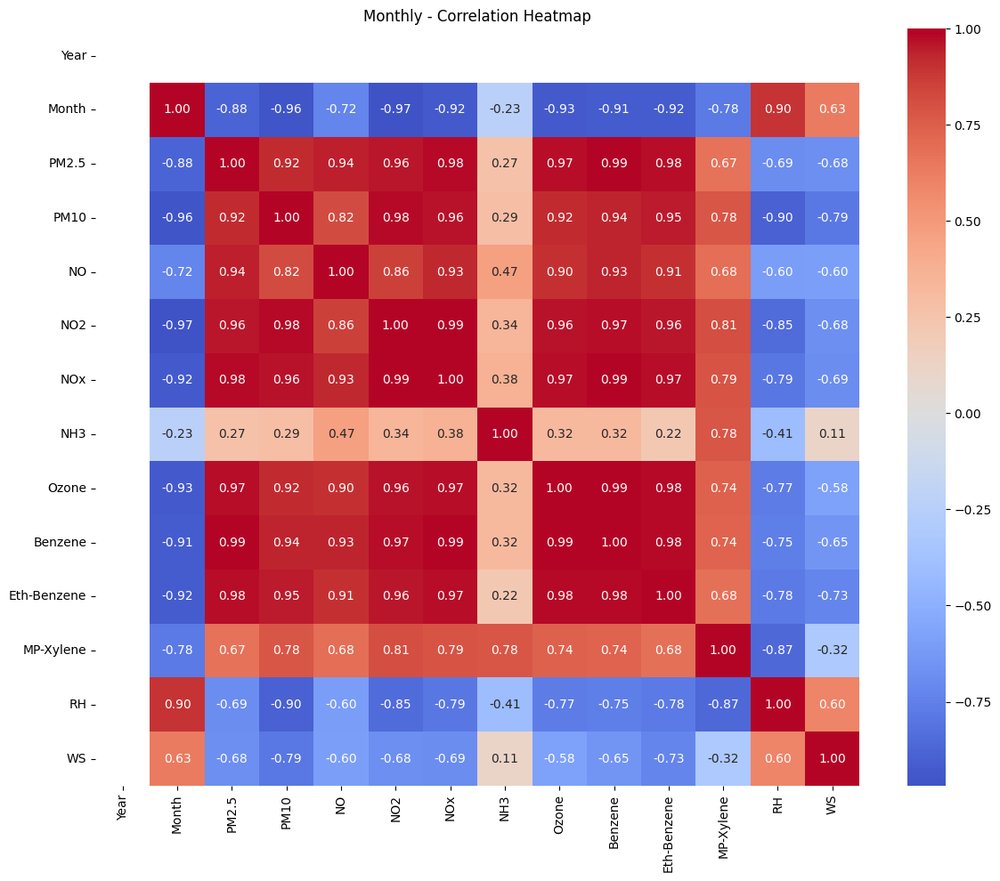

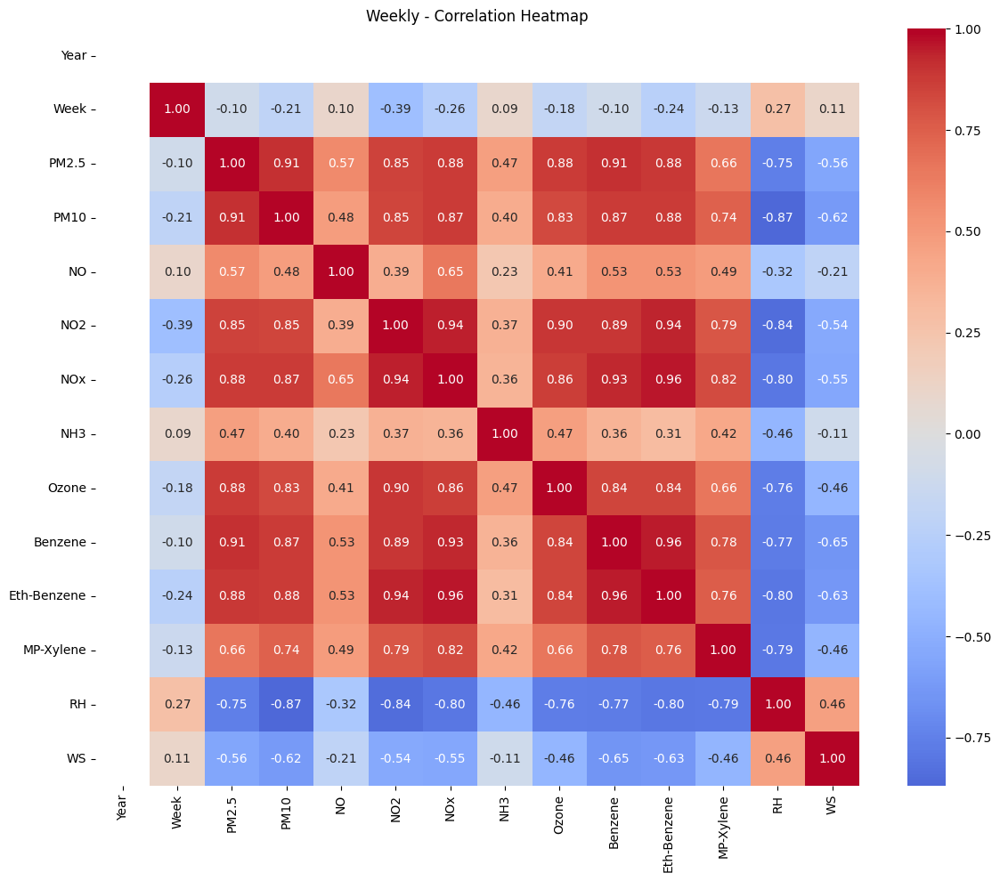

<Figure size 1500x800 with 0 Axes>

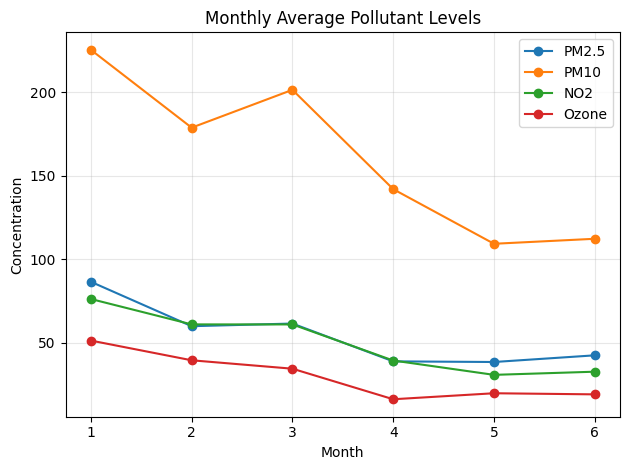

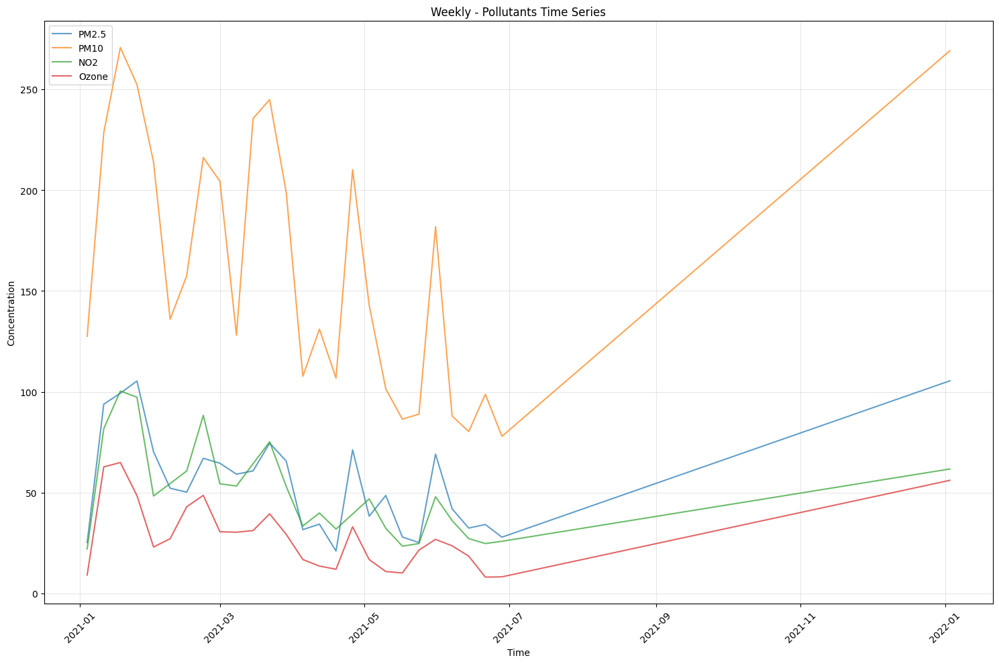

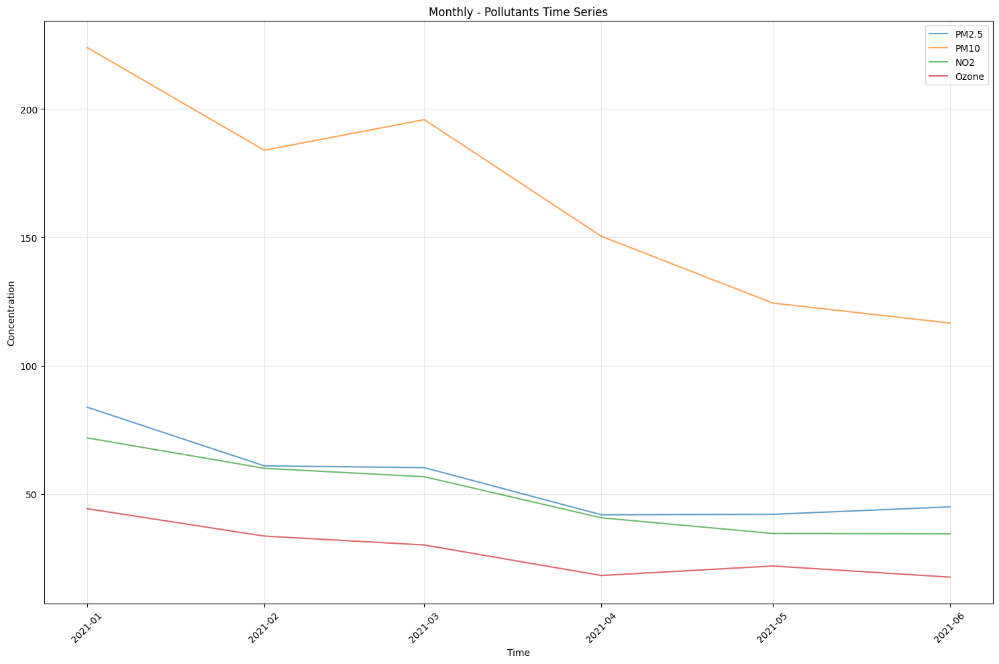

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read the datasets
daily_df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_daily.csv')
monthly_df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_monthly.csv')
weekly_df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_weekly.csv')

# Convert date columns
daily_df['From Date'] = pd.to_datetime(daily_df['From Date'])

# Check missing values
def check_missing_values(df, name):
    missing = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100
    
    print(f"\nMissing Values in {name}:")
    for col, miss in missing.items():
        if miss > 0:
            print(f"{col}: {miss} values missing ({missing_percent[col]:.2f}%)")

# Check missing values for all datasets
check_missing_values(daily_df, "Daily Dataset")
check_missing_values(monthly_df, "Monthly Dataset")
check_missing_values(weekly_df, "Weekly Dataset")

# Time series visualization functions
def plot_time_series(df, title, columns):
    plt.figure(figsize=(15, 10))
    
    for column in columns:
        x = df.index.values
        y = df[column].values
        plt.plot(x, y, label=column, alpha=0.7)
    
    plt.title(f'{title} - Pollutants Time Series')
    plt.xlabel('Time')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_correlation_heatmap(df, title):
    plt.figure(figsize=(12, 10))
    corr = df.select_dtypes(include=[np.number]).corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, fmt='.2f')
    plt.title(f'{title} - Correlation Heatmap')
    plt.tight_layout()
    plt.show()

# Set index for time series plots
daily_df.set_index('From Date', inplace=True)

# Main pollutants
main_pollutants = ['PM2.5', 'PM10', 'NO2', 'Ozone']
secondary_pollutants = ['NO', 'NOx', 'NH3', 'Benzene', 'Eth-Benzene', 'MP-Xylene']
environmental_factors = ['RH', 'WS']

# Plot time series for different groups of parameters
plot_time_series(daily_df, 'Daily Main', main_pollutants)
plot_time_series(daily_df, 'Daily Secondary', secondary_pollutants)
plot_time_series(daily_df, 'Daily Environmental Factors', environmental_factors)

# Correlation heatmaps
plot_correlation_heatmap(daily_df, 'Daily')
plot_correlation_heatmap(monthly_df, 'Monthly')
plot_correlation_heatmap(weekly_df, 'Weekly')

# Monthly trends
daily_df['Month'] = daily_df.index.month
monthly_means = daily_df.groupby('Month')[main_pollutants].mean()

plt.figure(figsize=(15, 8))
monthly_means.plot(kind='line', marker='o')
plt.title('Monthly Average Pollutant Levels')
plt.xlabel('Month')
plt.ylabel('Concentration')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

# Weekly trends for 2021
weekly_df['Date'] = pd.to_datetime(weekly_df['Year'].astype(str) + '-W' + weekly_df['Week'].astype(str) + '-1', format='%Y-W%W-%w')
weekly_df.set_index('Date', inplace=True)

plot_time_series(weekly_df, 'Weekly', main_pollutants)

# Monthly trends from monthly dataset
monthly_df['Date'] = pd.to_datetime(monthly_df['Year'].astype(str) + '-' + monthly_df['Month'].astype(str) + '-01')
monthly_df.set_index('Date', inplace=True)

plot_time_series(monthly_df, 'Monthly', main_pollutants)

# Save processed datasets with proper datetime index
daily_df.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_daily_processed.csv')
weekly_df.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_weekly_processed.csv')
monthly_df.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_monthly_processed.csv')

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import AutoDateLocator, DateFormatter
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error
import joblib
from pmdarima import auto_arima
import warnings
warnings.filterwarnings('ignore')

# Load and prepare data
def load_and_prepare_data():
    df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/Analysis/datasets/kurla_daily.csv')
    df['From Date'] = pd.to_datetime(df['From Date'])
    df.set_index('From Date', inplace=True)
    df.sort_index(inplace=True)  # Ensure data is sorted by date
    
    # Handle missing values more robustly
    df['PM2.5_filled'] = df['PM2.5'].interpolate(method='time').fillna(method='bfill')
    
    return df['PM2.5_filled']

# Check stationarity
def check_stationarity(series):
    result = adfuller(series)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    return result[1] > 0.05  # Return True if non-stationary

# Find optimal SARIMA parameters using auto_arima
def find_optimal_params(series):
    # Use stepwise=True for faster search (but less thorough)
    model = auto_arima(series, 
                      start_p=0, start_q=0,
                      max_p=3, max_q=3,
                      start_P=0, start_Q=0,
                      max_P=2, max_Q=2,
                      m=30,  # Assuming monthly seasonality (30 days)
                      seasonal=True,
                      d=None, D=None,  # Let model determine differencing
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)
    
    print(model.summary())
    return model.order, model.seasonal_order

# Main analysis function
def main():
    # Load and prepare data
    data = load_and_prepare_data()
    
    # Plot original data
    plt.figure(figsize=(12, 6))
    data.plot()
    plt.title('Original PM2.5 Time Series')
    plt.ylabel('PM2.5')
    plt.show()
    
    # Check stationarity
    print("Original Data Stationarity Check:")
    if check_stationarity(data):
        print("Data is non-stationary - differencing needed")
    else:
        print("Data is stationary")
    
    # Apply log transformation to stabilize variance
    data_transformed = np.log1p(data)
    
    # Split the data
    train_size = int(len(data_transformed) * 0.8)  # Increased training size
    train = data_transformed[:train_size]
    test = data_transformed[train_size:]
    
    # Find optimal parameters (comment out after first run to save time)
    # order, seasonal_order = find_optimal_params(train)
    # print(f"Optimal order: {order}, seasonal_order: {seasonal_order}")
    
    # After auto_arima finds optimal params, you can hardcode them:
    order = (1, 1, 2)  # Example - replace with your auto_arima results
    seasonal_order = (1, 1, 1, 30)  # Example
    
    # Fit SARIMA model with better parameter settings
    model = SARIMAX(train,
                   order=order,
                   seasonal_order=seasonal_order,
                   enforce_stationarity=False,
                   enforce_invertibility=False,
                   measurement_error=True,  # Account for measurement errors
                   time_varying_regression=False,
                   mle_regression=False)
    
    # Fit with more iterations and better optimization
    model_fit = model.fit(disp=True, maxiter=100, method='lbfgs')
    
    # Print model summary
    print(model_fit.summary())
    
    # Diagnostic plots
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.tight_layout()
    plt.show()
    
    # Get predictions with confidence intervals
    train_pred = model_fit.get_prediction(start=train.index[0], dynamic=False)
    train_forecast = np.expm1(train_pred.predicted_mean)
    train_conf_int = np.expm1(train_pred.conf_int())
    
    test_forecast = np.expm1(model_fit.forecast(steps=len(test)))
    test_conf_int = np.expm1(model_fit.get_forecast(steps=len(test)).conf_int())
    
    # Convert to numpy arrays for plotting
    train_dates = pd.to_datetime(train.index).values
    test_dates = pd.to_datetime(test.index).values
    train_values = np.expm1(train.values)
    test_values = np.expm1(test.values)
    
    # Create figure with subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 15))
    
    # Plot 1: Training Period - Actual vs Predicted with Confidence Intervals
    ax1.plot(train_dates, train_values, label='Actual', color='blue')
    ax1.plot(train_dates, train_forecast, label='Predicted', color='red', linestyle='--')
    ax1.fill_between(train_dates, 
                    train_conf_int.iloc[:, 0], 
                    train_conf_int.iloc[:, 1], 
                    color='pink', alpha=0.3)
    ax1.set_title('Training Period: Actual vs Predicted')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('PM2.5')
    ax1.legend()
    ax1.grid(True)
    
    # Plot 2: Testing Period - Actual vs Predicted with Confidence Intervals
    ax2.plot(test_dates, test_values, label='Actual', color='blue')
    ax2.plot(test_dates, test_forecast, label='Predicted', color='red', linestyle='--')
    ax2.fill_between(test_dates, 
                    test_conf_int.iloc[:, 0], 
                    test_conf_int.iloc[:, 1], 
                    color='pink', alpha=0.3)
    ax2.set_title('Testing Period: Actual vs Predicted')
    ax2.set_xlabel('Date')
    ax2.set_ylabel('PM2.5')
    ax2.legend()
    ax2.grid(True)
    
    # Format dates on x-axis
    for ax in [ax1, ax2]:
        ax.xaxis.set_major_locator(AutoDateLocator())
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    # Plot 3: Training Scatter Plot with regression line
    sns.regplot(x=train_values, y=train_forecast, ax=ax3, scatter_kws={'alpha':0.5})
    ax3.plot([train_values.min(), train_values.max()], 
             [train_values.min(), train_values.max()], 
             'r--', lw=2)
    ax3.set_xlabel('Actual Values')
    ax3.set_ylabel('Predicted Values')
    ax3.set_title('Training: Actual vs Predicted Values')
    ax3.grid(True)
    
    # Plot 4: Testing Scatter Plot with regression line
    sns.regplot(x=test_values, y=test_forecast, ax=ax4, scatter_kws={'alpha':0.5})
    ax4.plot([test_values.min(), test_values.max()], 
             [test_values.min(), test_values.max()], 
             'r--', lw=2)
    ax4.set_xlabel('Actual Values')
    ax4.set_ylabel('Predicted Values')
    ax4.set_title('Testing: Actual vs Predicted Values')
    ax4.grid(True)
    
    # Adjust layout and display
    plt.tight_layout()
    plt.show()
    
    # Define metrics calculation function
    def calculate_metrics(actual, predicted):
        mse = mean_squared_error(actual, predicted)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(actual, predicted)
        mape = np.mean(np.abs((actual - predicted)/actual)) * 100
        r2 = 1 - (mse / np.var(actual))  # R-squared
        return {'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R2': r2}
    
    # Calculate and print metrics
    train_metrics = calculate_metrics(train_values, train_forecast)
    test_metrics = calculate_metrics(test_values, test_forecast)
    
    print("\nTraining Set Metrics:")
    for k,v in train_metrics.items():
        print(f"{k}: {v:.2f}")
    
    print("\nTest Set Metrics:")
    for k,v in test_metrics.items():
        print(f"{k}: {v:.2f}")
    
    # Save the model
    os.makedirs('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/Analysis/models', exist_ok=True)
    joblib.dump(model_fit, 'c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/Analysis/models/sarima_model_optimized.pkl')

if __name__ == "__main__":
    main()

KeyError: 'PM2.5'

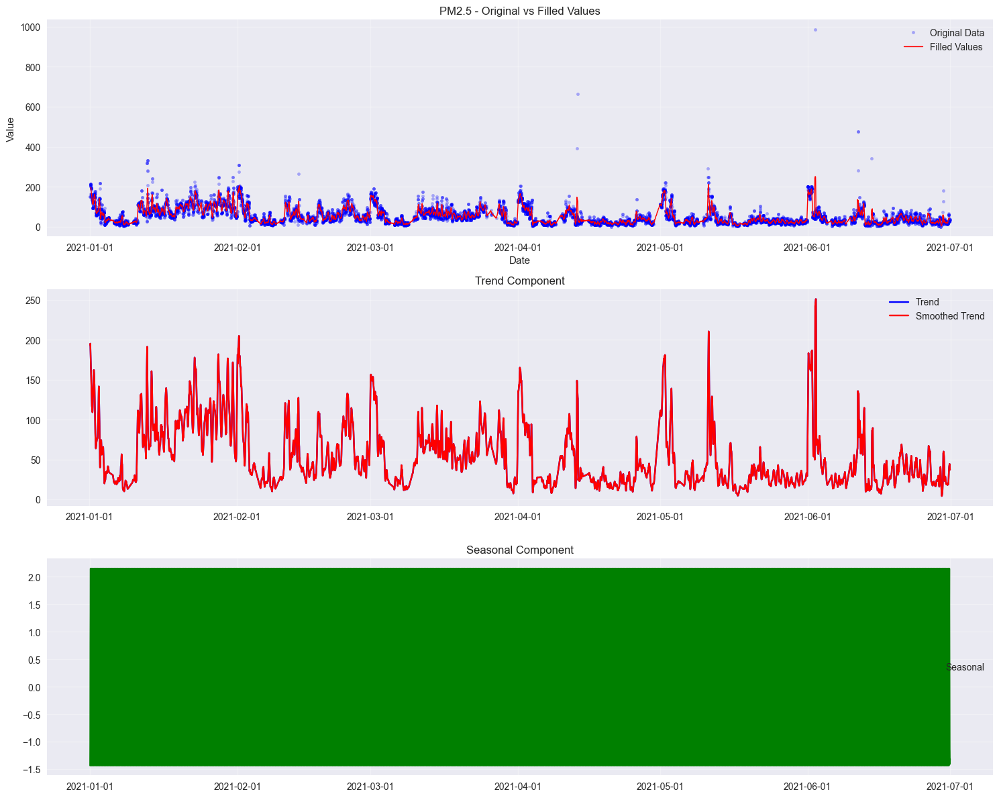


Statistics for PM2.5:
Longest gap: 1 measurements
Missing values before: 6173
Missing values after: 24


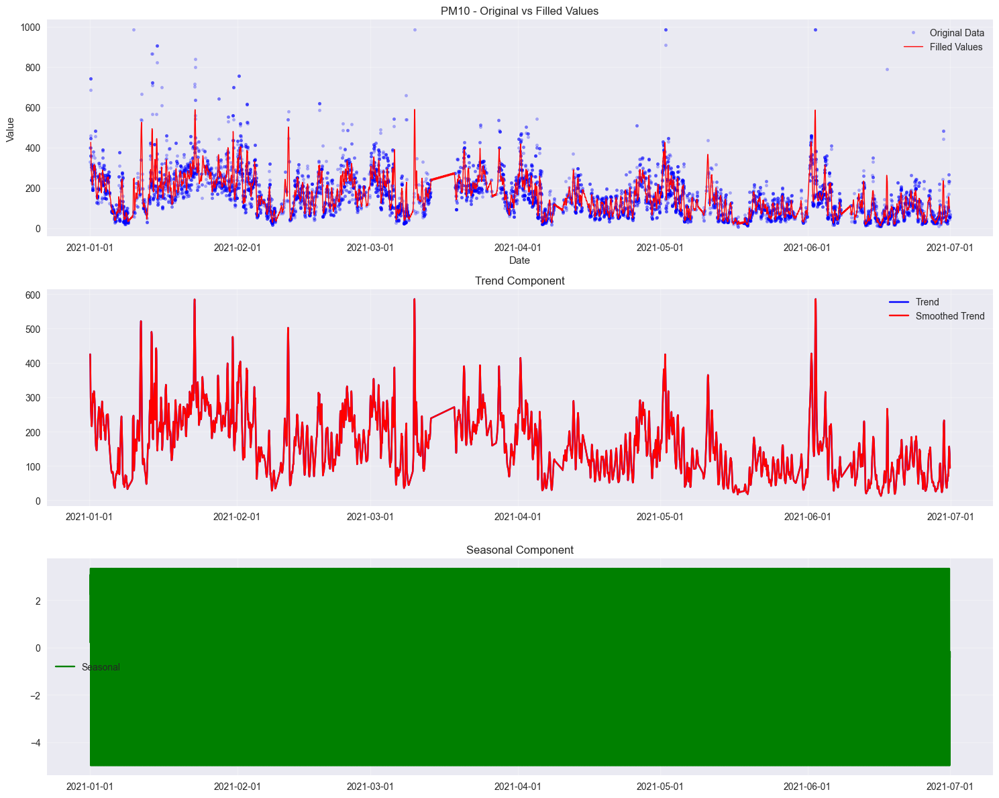


Statistics for PM10:
Longest gap: 1 measurements
Missing values before: 8199
Missing values after: 24


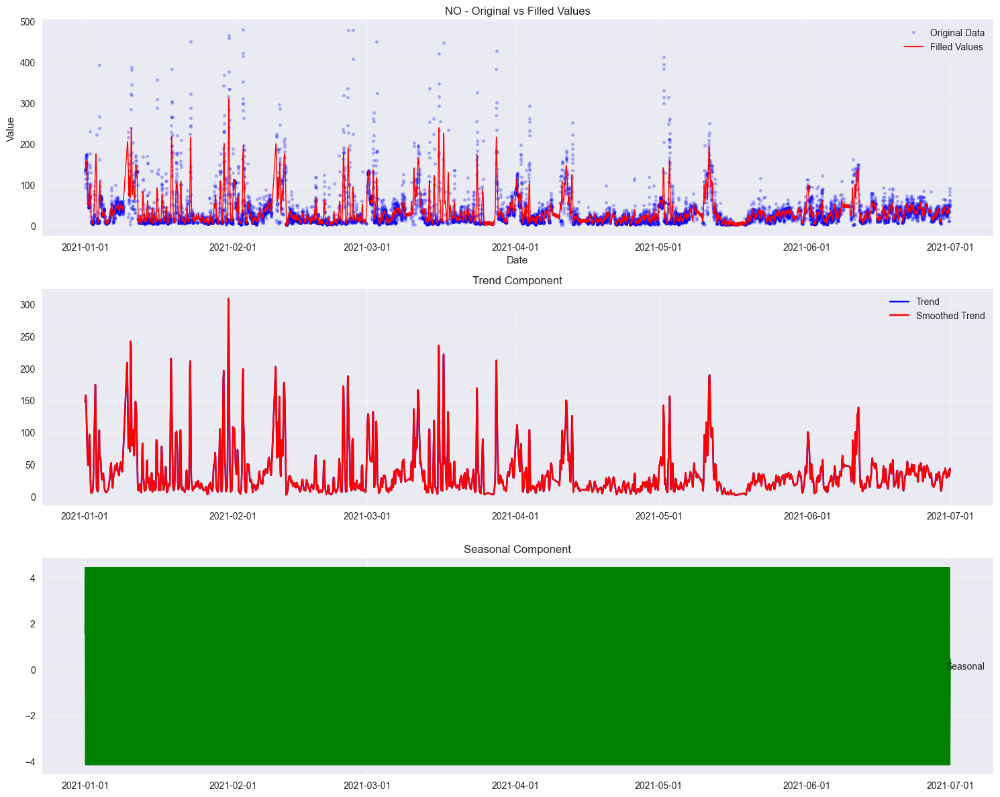


Statistics for NO:
Longest gap: 1 measurements
Missing values before: 7189
Missing values after: 24


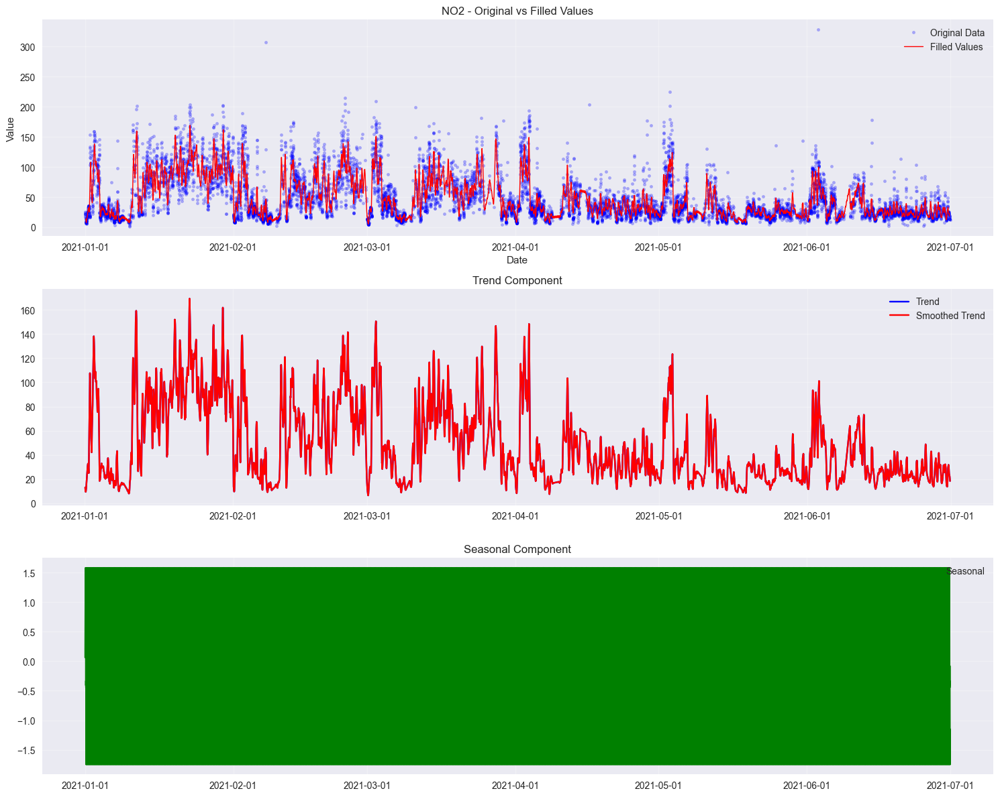


Statistics for NO2:
Longest gap: 1 measurements
Missing values before: 7156
Missing values after: 24


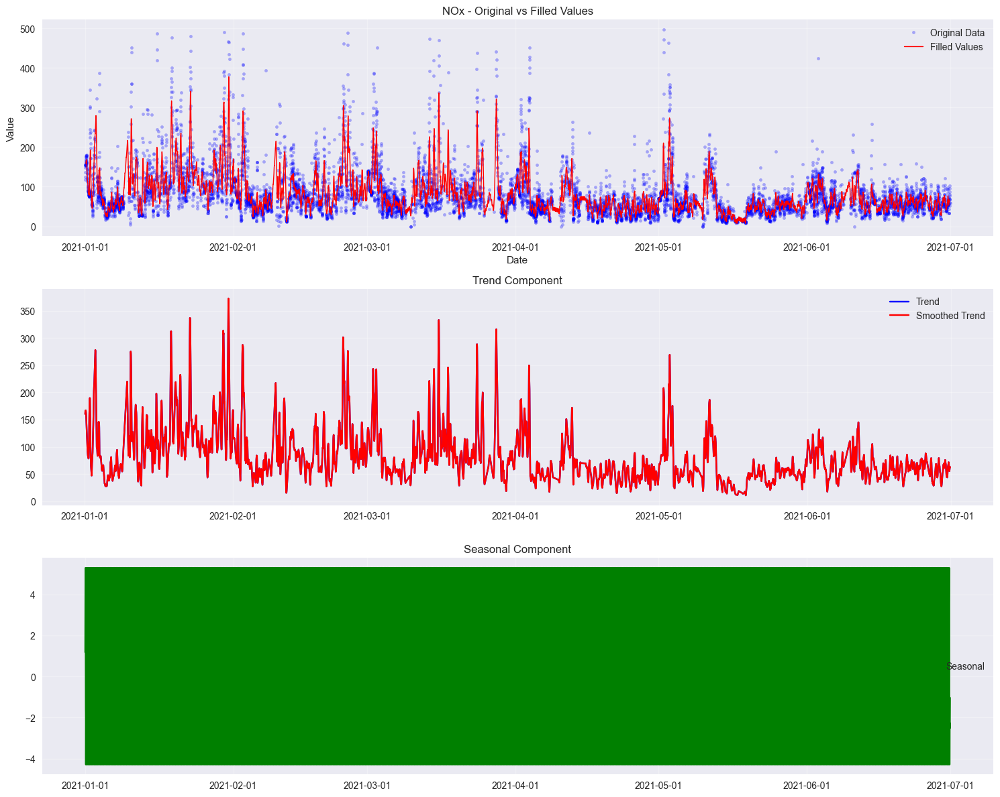


Statistics for NOx:
Longest gap: 1 measurements
Missing values before: 7182
Missing values after: 24


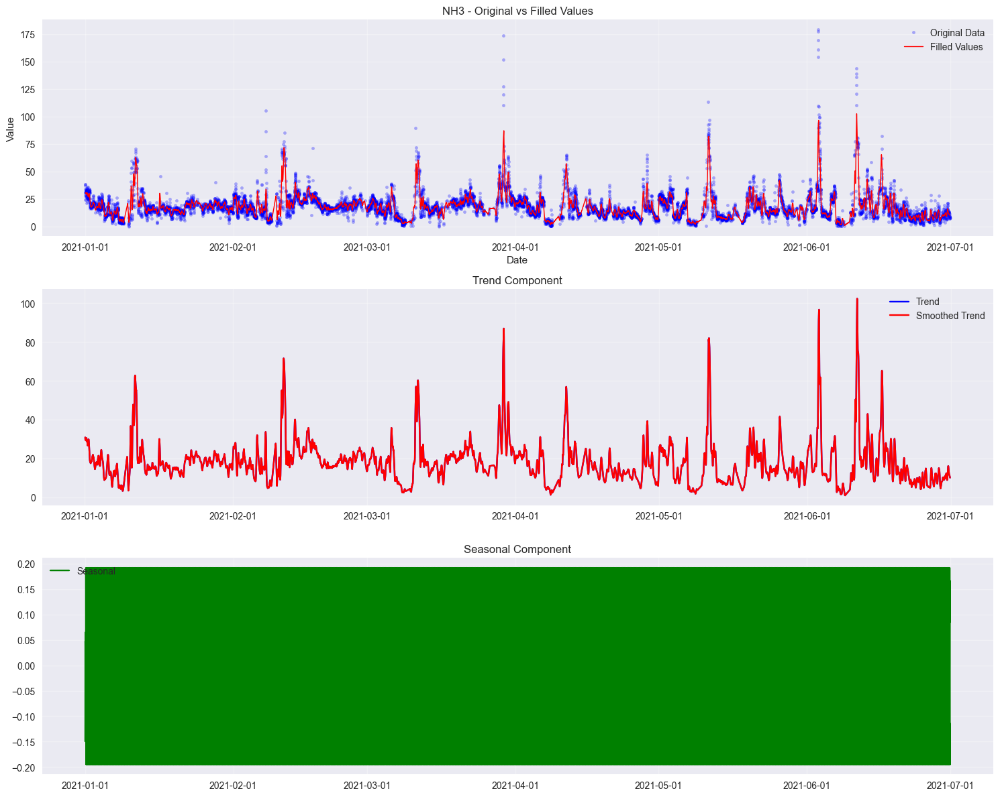


Statistics for NH3:
Longest gap: 1 measurements
Missing values before: 7165
Missing values after: 24


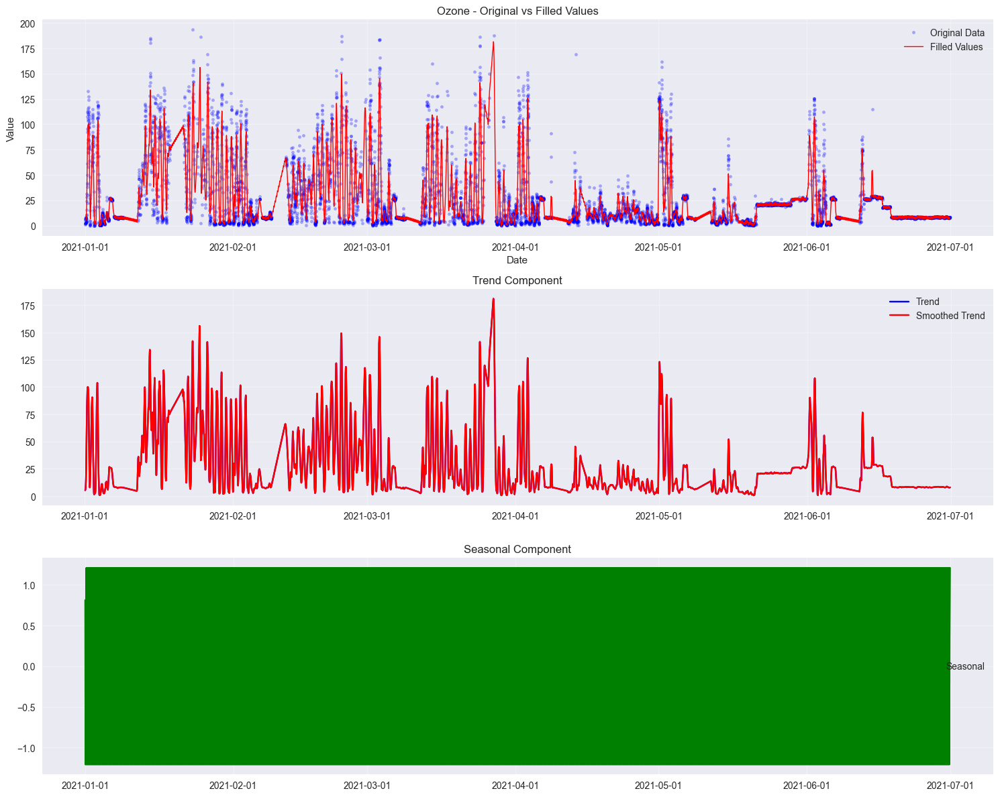


Statistics for Ozone:
Longest gap: 1 measurements
Missing values before: 8886
Missing values after: 24


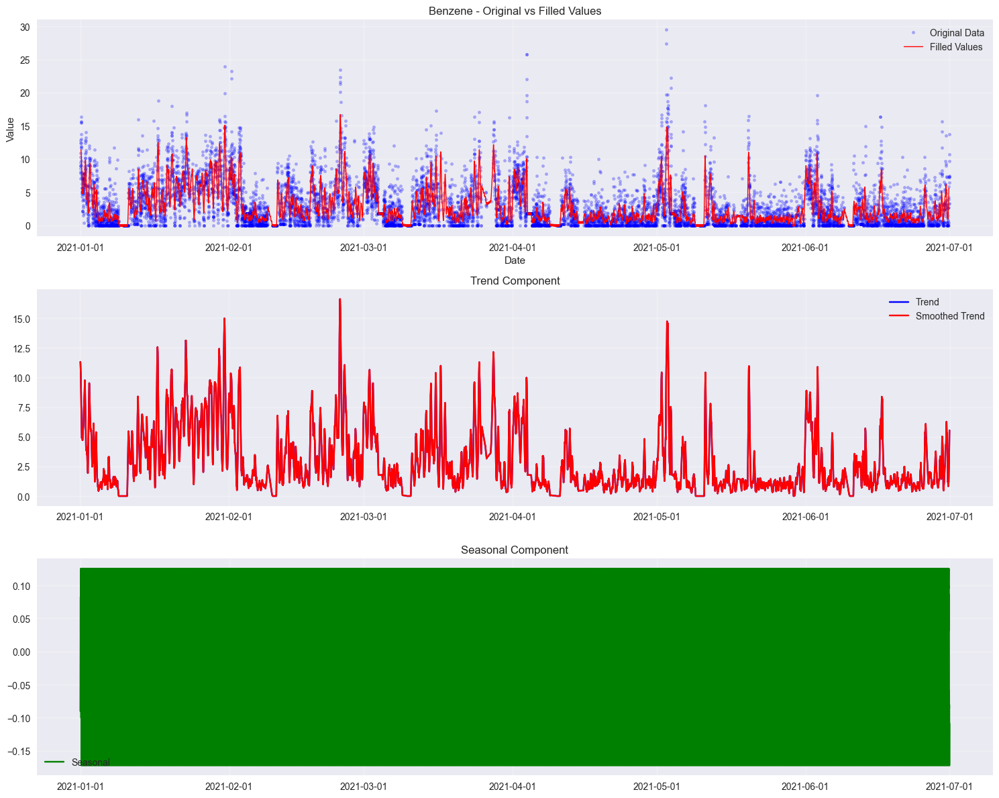


Statistics for Benzene:
Longest gap: 1 measurements
Missing values before: 6551
Missing values after: 24


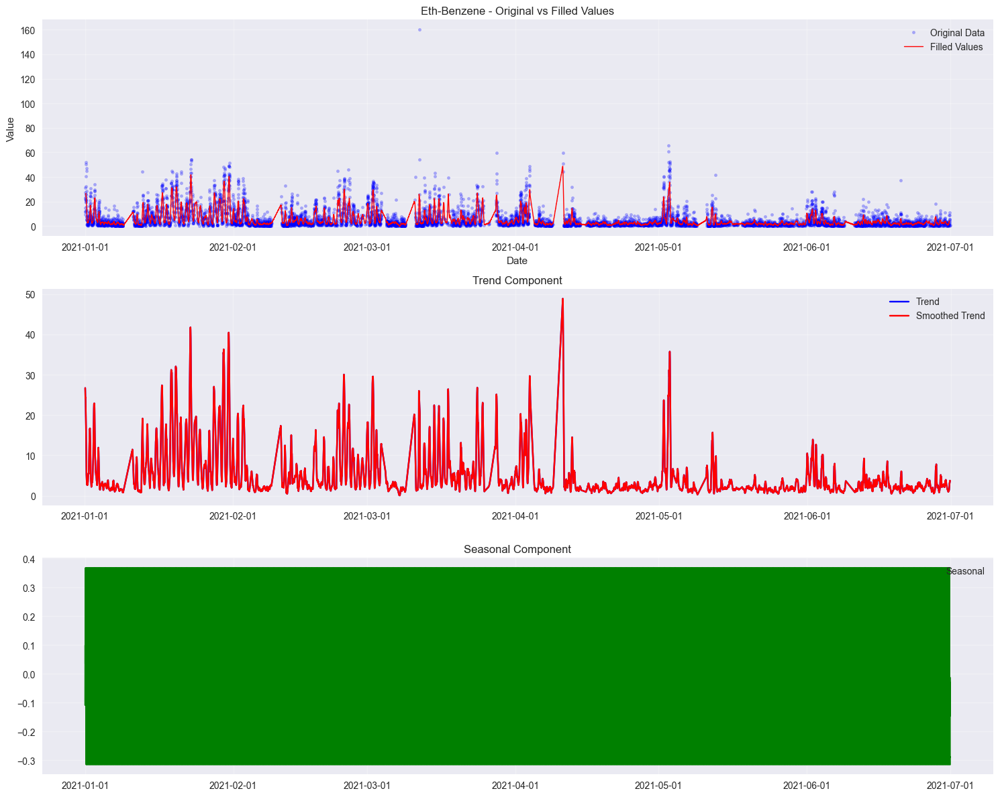


Statistics for Eth-Benzene:
Longest gap: 1 measurements
Missing values before: 9269
Missing values after: 24


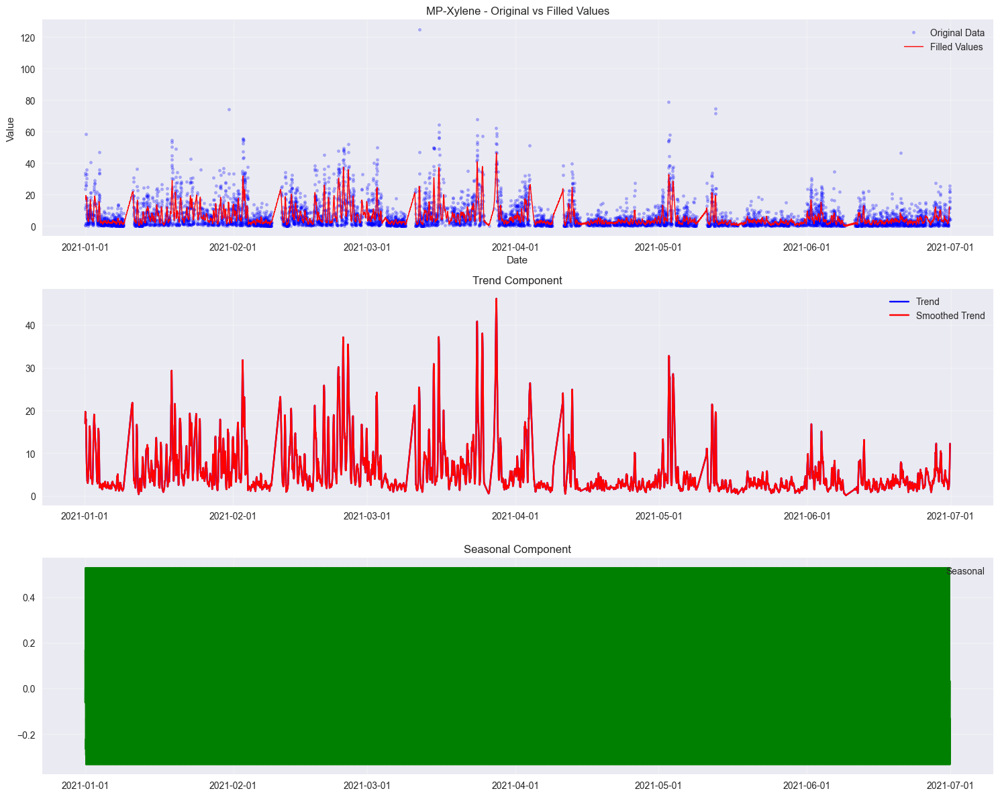


Statistics for MP-Xylene:
Longest gap: 1 measurements
Missing values before: 9389
Missing values after: 24


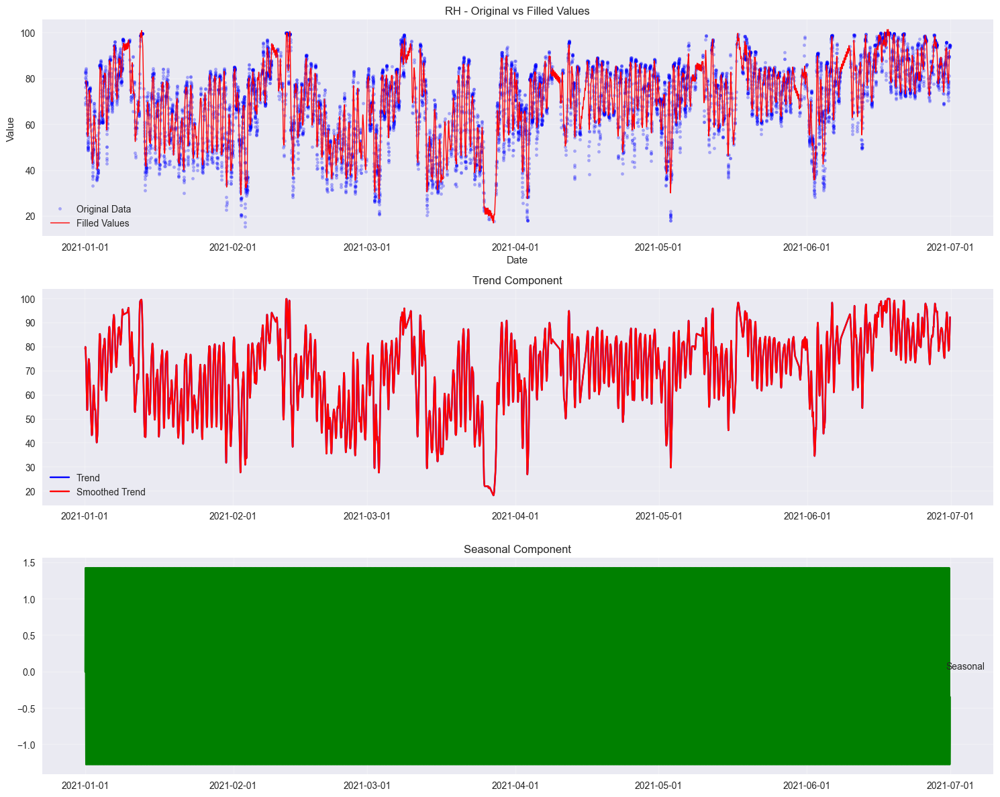


Statistics for RH:
Longest gap: 1 measurements
Missing values before: 7531
Missing values after: 24


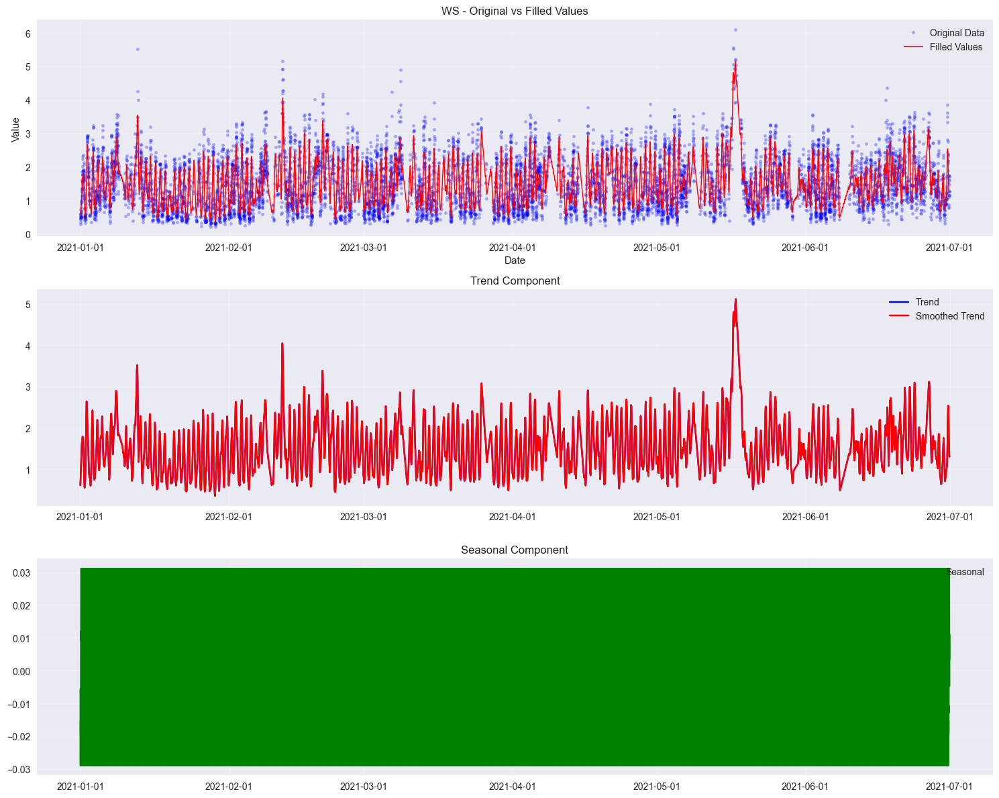


Statistics for WS:
Longest gap: 1 measurements
Missing values before: 7531
Missing values after: 24


C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\4087016296.py:102: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df[f'{pollutant}_filled'].resample('M').mean()
C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\4087016296.py:102: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df[f'{pollutant}_filled'].resample('M').mean()
C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\4087016296.py:102: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df[f'{pollutant}_filled'].resample('M').mean()
C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\4087016296.py:102: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df[f'{pollutant}_filled'].resample('M').mean()
C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\4087016296.py:102: FutureW

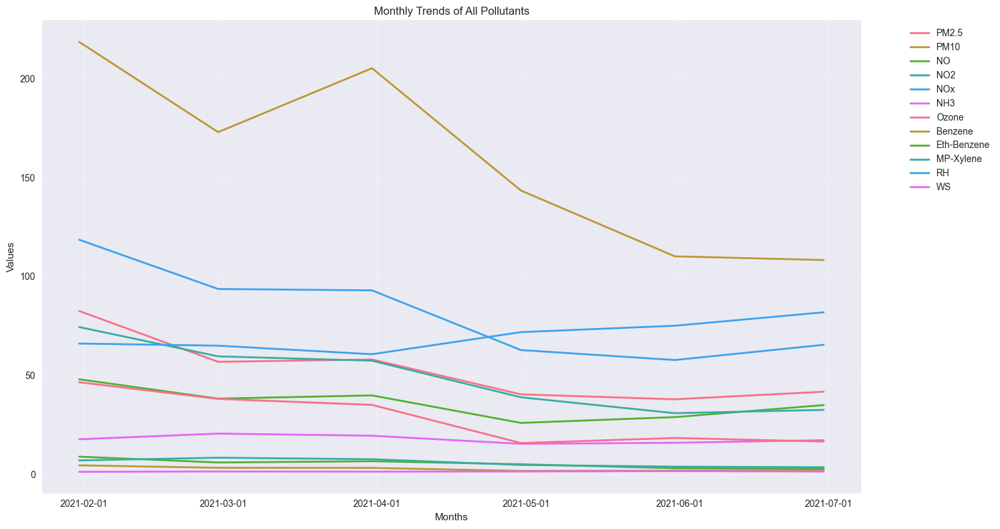

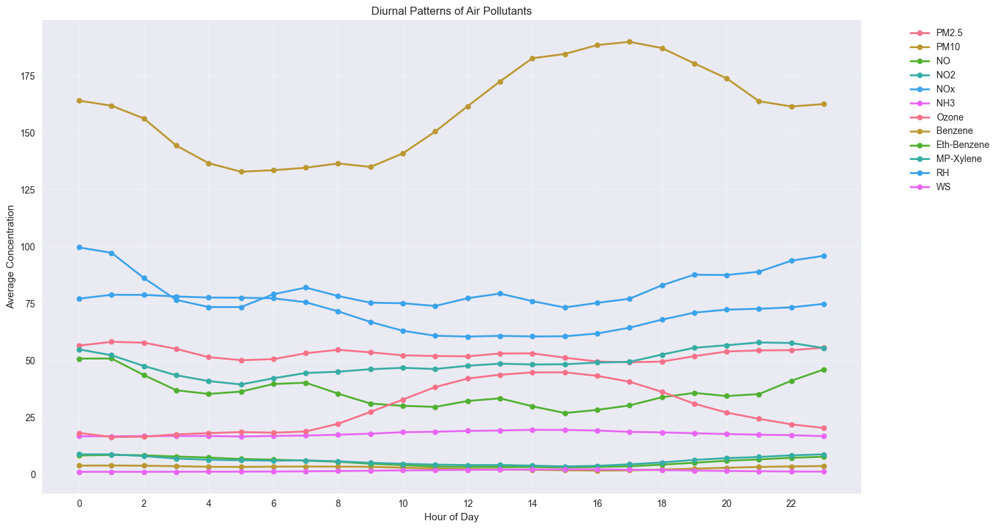

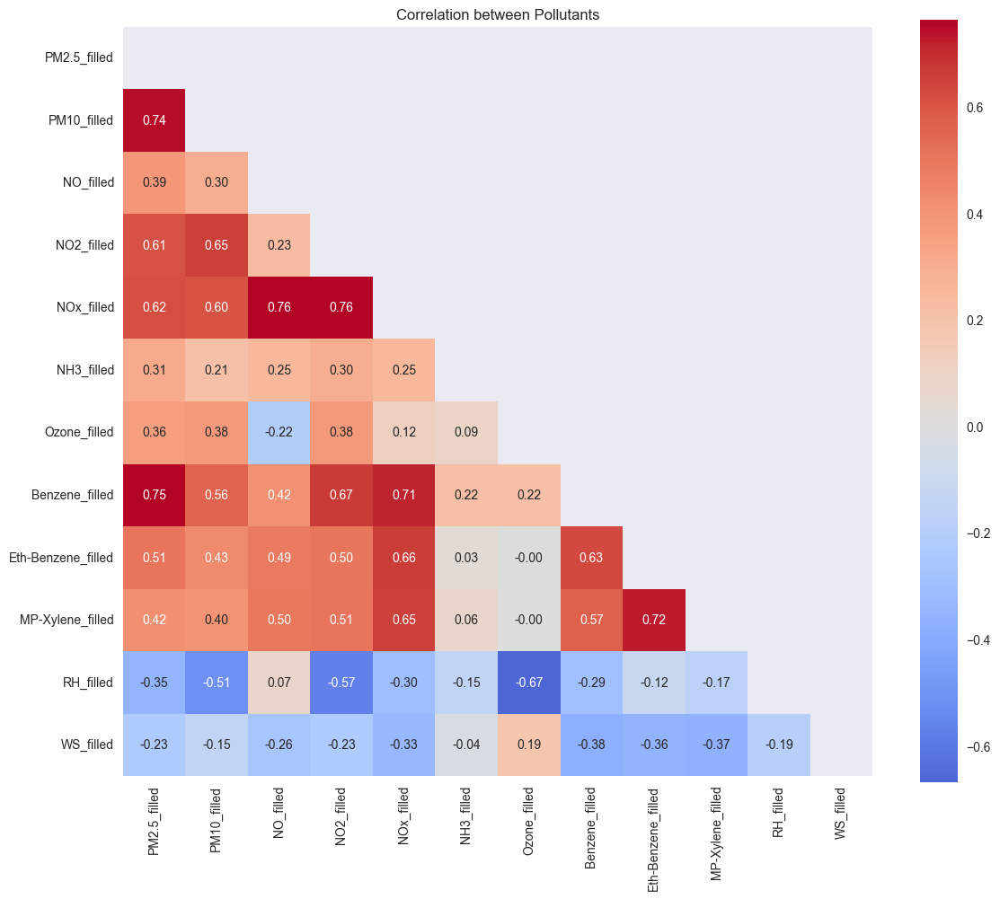


Processed data saved to: c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_processed.csv

Final Summary of Missing Values:
PM2.5: 24 missing values
PM10: 24 missing values
NO: 24 missing values
NO2: 24 missing values
NOx: 24 missing values
NH3: 24 missing values
Ozone: 24 missing values
Benzene: 24 missing values
Eth-Benzene: 24 missing values
MP-Xylene: 24 missing values
RH: 24 missing values
WS: 24 missing values

Value Ranges for Filled Data:
PM2.5: Min = 3.09, Max = 250.71, Mean = 53.05
PM10: Min = 9.56, Max = 588.71, Mean = 159.92
NO: Min = -2.21, Max = 310.06, Mean = 36.11
NO2: Min = 5.18, Max = 169.18, Mean = 49.02
NOx: Min = 7.14, Max = 377.18, Mean = 81.91
NH3: Min = 0.88, Max = 102.39, Mean = 17.80
Ozone: Min = -0.59, Max = 181.58, Mean = 28.48
Benzene: Min = -0.17, Max = 16.70, Mean = 2.89
Eth-Benzene: Min = -0.18, Max = 48.82, Mean = 5.54
MP-Xylene: Min = -0.11, Max = 46.46, Mean = 5.96
RH: Min = 16.85, Max = 101.25, Mean = 70.17
WS: Min = 0.34, Ma

In [14]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from statsmodels.tsa.seasonal import seasonal_decompose

# Set style for better visualizations
plt.style.use('seaborn')
sns.set_palette("husl")

# Load and prepare dataset
df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla.csv')
df['From Date'] = pd.to_datetime(df['From Date'])
df.set_index('From Date', inplace=True)
df = df.sort_index()

# List of pollutants to analyze
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'Ozone', 
              'Benzene', 'Eth-Benzene', 'MP-Xylene', 'RH', 'WS']

def find_longest_gap(series):
    mask = series.isna()
    if not mask.any():
        return 1
    consecutive_nans = mask.astype(int).groupby(mask.cumsum()).sum()
    return int(consecutive_nans.max())

# Process each pollutant
for pollutant in pollutants:
    if pollutant not in df.columns:
        print(f"Skipping {pollutant} - not found in dataset")
        continue
    
    window_size = find_longest_gap(df[pollutant])
    fig = plt.figure(figsize=(15, 12))
    
    # Interpolate and decompose
    temp_series = df[pollutant].interpolate(method='linear')
    decomposition = seasonal_decompose(temp_series, period=24)
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    # Fill missing values
    rolling_trend = trend.rolling(window=window_size, center=True, min_periods=1).mean()
    filled_values = rolling_trend + seasonal
    df[f'{pollutant}_filled'] = filled_values
    
    # Plot original vs filled values
    ax1 = plt.subplot(311)
    valid_data = df[pollutant].dropna()
    
    # Convert datetime index to numpy datetime64 array
    valid_dates = valid_data.index.values
    valid_values = valid_data.values
    filled_dates = df.index.values
    filled_vals = filled_values.values
    
    ax1.plot_date(valid_dates, valid_values, 'b.', alpha=0.3, label='Original Data')
    ax1.plot_date(filled_dates, filled_vals, 'r-', linewidth=1, label='Filled Values')
    ax1.set_title(f'{pollutant} - Original vs Filled Values')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Value')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    
    # Plot trend
    ax2 = plt.subplot(312)
    ax2.plot_date(trend.index.values, trend.values, 'b-', label='Trend')
    ax2.plot_date(rolling_trend.index.values, rolling_trend.values, 'r-', label='Smoothed Trend')
    ax2.set_title('Trend Component')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    ax2.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    
    # Plot seasonal
    ax3 = plt.subplot(313)
    ax3.plot_date(seasonal.index.values, seasonal.values, 'g-', label='Seasonal')
    ax3.set_title('Seasonal Component')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    ax3.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nStatistics for {pollutant}:")
    print(f"Longest gap: {window_size} measurements")
    print(f"Missing values before: {df[pollutant].isna().sum()}")
    print(f"Missing values after: {df[f'{pollutant}_filled'].isna().sum()}")

# Monthly trends
fig, ax = plt.subplots(figsize=(15, 8))

for pollutant in pollutants:
    if f'{pollutant}_filled' not in df.columns:
        continue
    monthly_avg = df[f'{pollutant}_filled'].resample('M').mean()
    ax.plot_date(monthly_avg.index.values, monthly_avg.values, '-', linewidth=2, label=pollutant)

ax.set_title('Monthly Trends of All Pollutants')
ax.set_xlabel('Months')
ax.set_ylabel('Values')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)
ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
plt.tight_layout()
plt.show()

# Hourly patterns
fig, ax = plt.subplots(figsize=(15, 8))

for pollutant in pollutants:
    if f'{pollutant}_filled' not in df.columns:
        continue
    hourly_avg = df[f'{pollutant}_filled'].groupby(df.index.hour).mean()
    hours = np.array(hourly_avg.index)
    values = np.array(hourly_avg.values)
    ax.plot(hours, values, '-o', linewidth=2, markersize=6, label=pollutant)

ax.set_title('Diurnal Patterns of Air Pollutants')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Average Concentration')
ax.set_xticks(range(0, 24, 2))
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Correlation heatmap
filled_columns = [col for col in df.columns if col.endswith('_filled')]
correlation = df[filled_columns].corr()

plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(correlation, dtype=bool))
sns.heatmap(correlation, mask=mask, annot=True, cmap='coolwarm', 
            center=0, fmt='.2f', square=True)
plt.title('Correlation between Pollutants')
plt.tight_layout()
plt.show()

# Save processed dataset
output_path = 'c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_processed.csv'
df.to_csv(output_path)
print(f"\nProcessed data saved to: {output_path}")

# Print summary statistics
print("\nFinal Summary of Missing Values:")
for pollutant in pollutants:
    if f'{pollutant}_filled' in df.columns:
        print(f"{pollutant}: {df[f'{pollutant}_filled'].isna().sum()} missing values")

print("\nValue Ranges for Filled Data:")
for pollutant in pollutants:
    if f'{pollutant}_filled' in df.columns:
        filled_data = df[f'{pollutant}_filled']
        print(f"{pollutant}: Min = {filled_data.min():.2f}, Max = {filled_data.max():.2f}, Mean = {filled_data.mean():.2f}")

In [15]:
# Import necessary libraries
import pandas as pd

# Read the processed dataset
df = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_processed.csv')
df['From Date'] = pd.to_datetime(df['From Date'])
df.set_index('From Date', inplace=True)

# List of columns to aggregate (only the filled values)
columns_to_aggregate = [col for col in df.columns if col.endswith('_filled')]

# Create hourly averages
hourly_data = df[columns_to_aggregate].resample('H').mean()
hourly_data.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_hourly.csv')

# Create daily averages
daily_data = df[columns_to_aggregate].resample('D').mean()
daily_data.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_daily.csv')

# Create weekly averages
weekly_data = df[columns_to_aggregate].resample('W').mean()
weekly_data.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_weekly.csv')

# Create monthly averages
monthly_data = df[columns_to_aggregate].resample('M').mean()
monthly_data.to_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_monthly.csv')

print("Files have been created:")
print("1. Hourly data: kurla_hourly.csv")
print("2. Daily data: kurla_daily.csv")
print("3. Weekly data: kurla_weekly.csv")
print("4. Monthly data: kurla_monthly.csv")

# Print sample information about each dataset
print("\nDataset Information:")
print(f"Hourly records: {len(hourly_data)}")
print(f"Daily records: {len(daily_data)}")
print(f"Weekly records: {len(weekly_data)}")
print(f"Monthly records: {len(monthly_data)}")

Files have been created:
1. Hourly data: kurla_hourly.csv
2. Daily data: kurla_daily.csv
3. Weekly data: kurla_weekly.csv
4. Monthly data: kurla_monthly.csv

Dataset Information:
Hourly records: 4344
Daily records: 181
Weekly records: 27
Monthly records: 6


C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\1470731516.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_data = df[columns_to_aggregate].resample('H').mean()
C:\Users\kunal\AppData\Local\Temp\ipykernel_22236\1470731516.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = df[columns_to_aggregate].resample('M').mean()


Daily Trends:


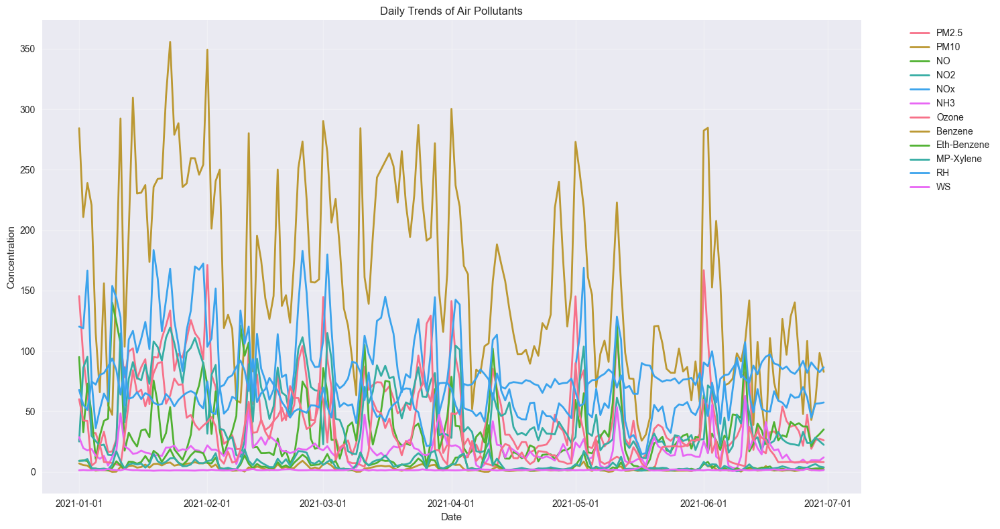


Weekly Trends:


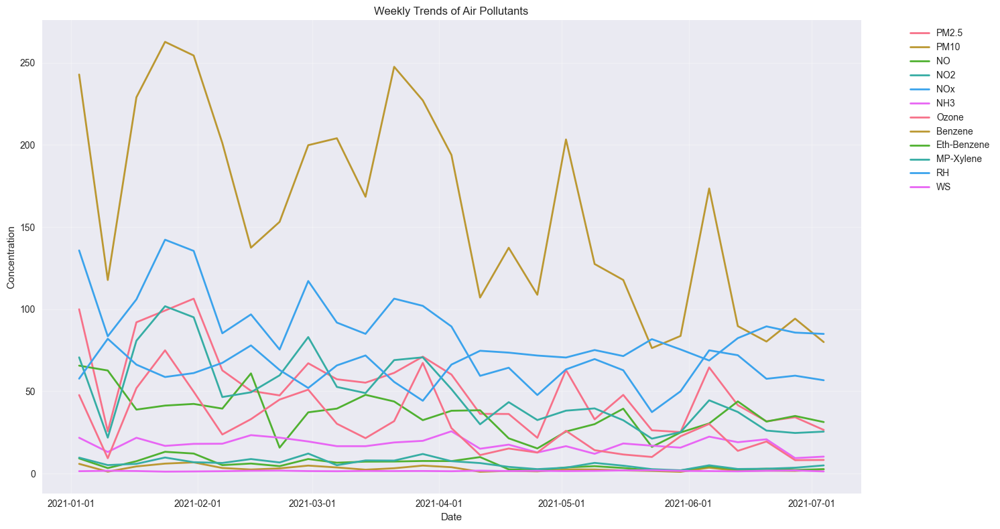


Monthly Trends:


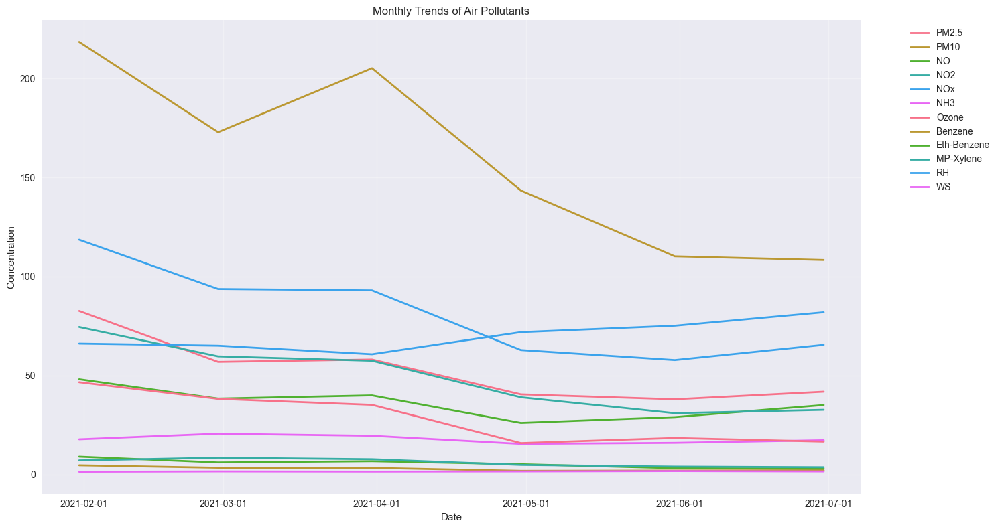


Correlation Heatmaps:


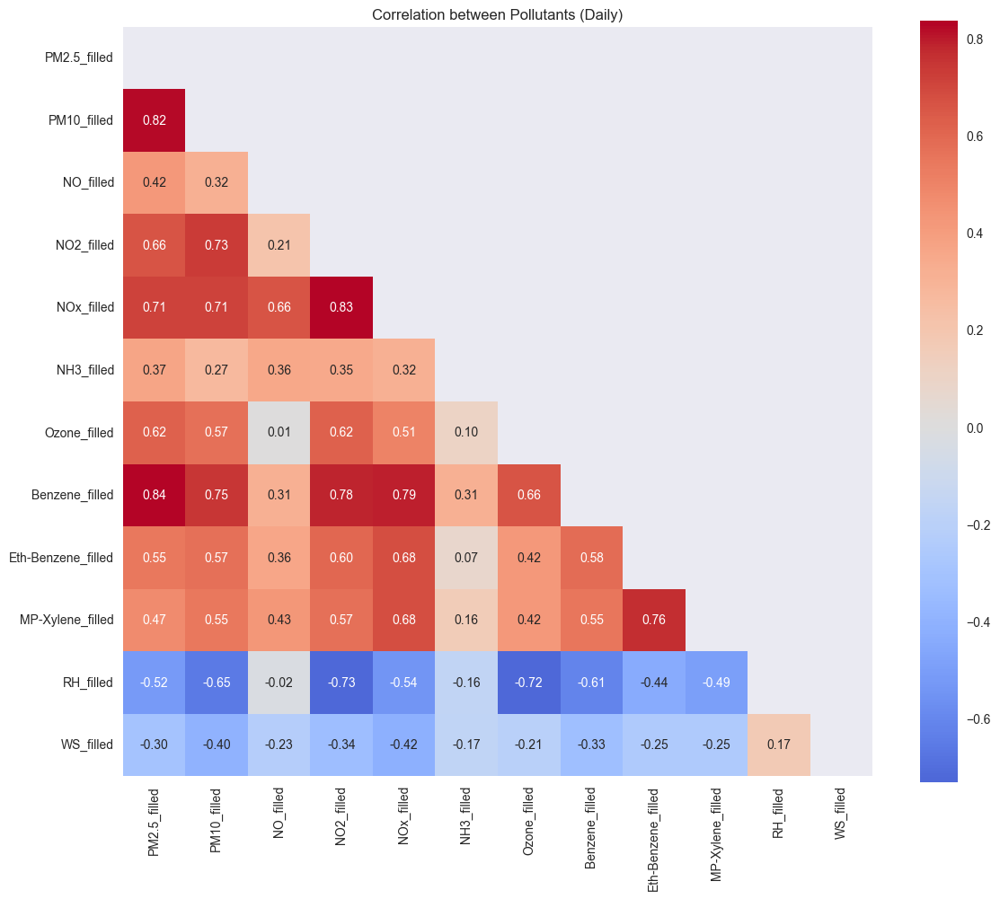

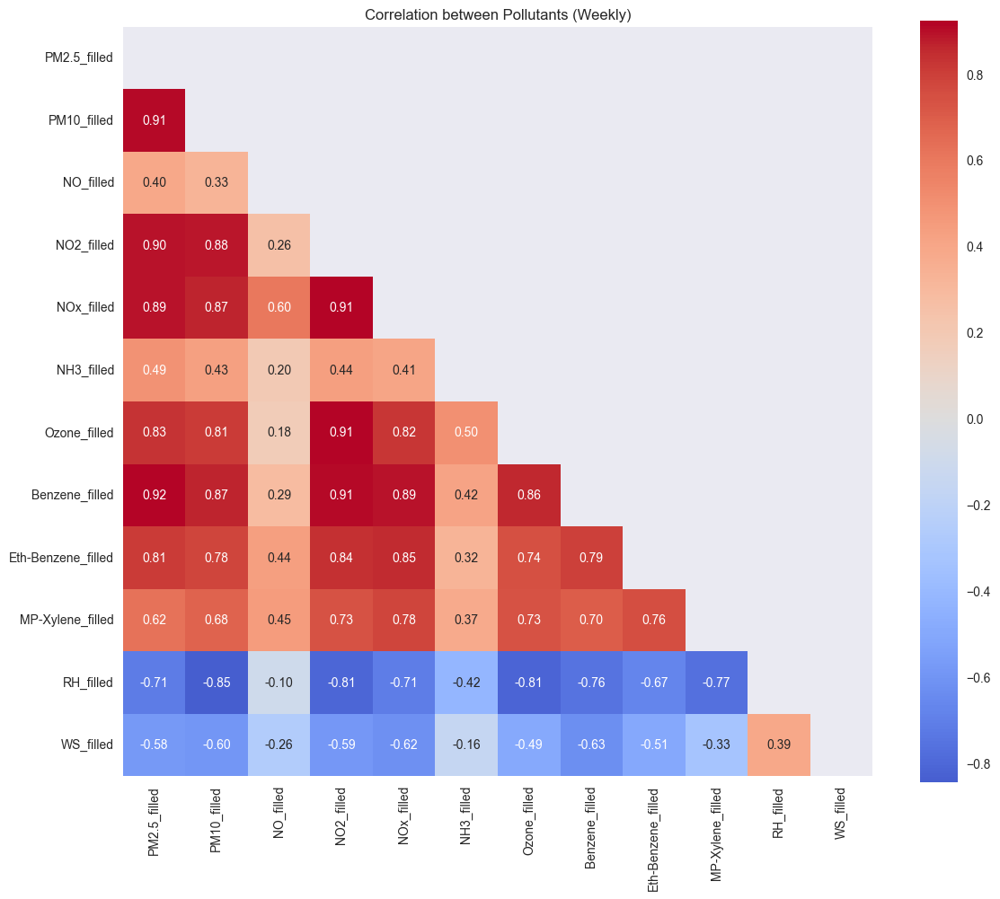

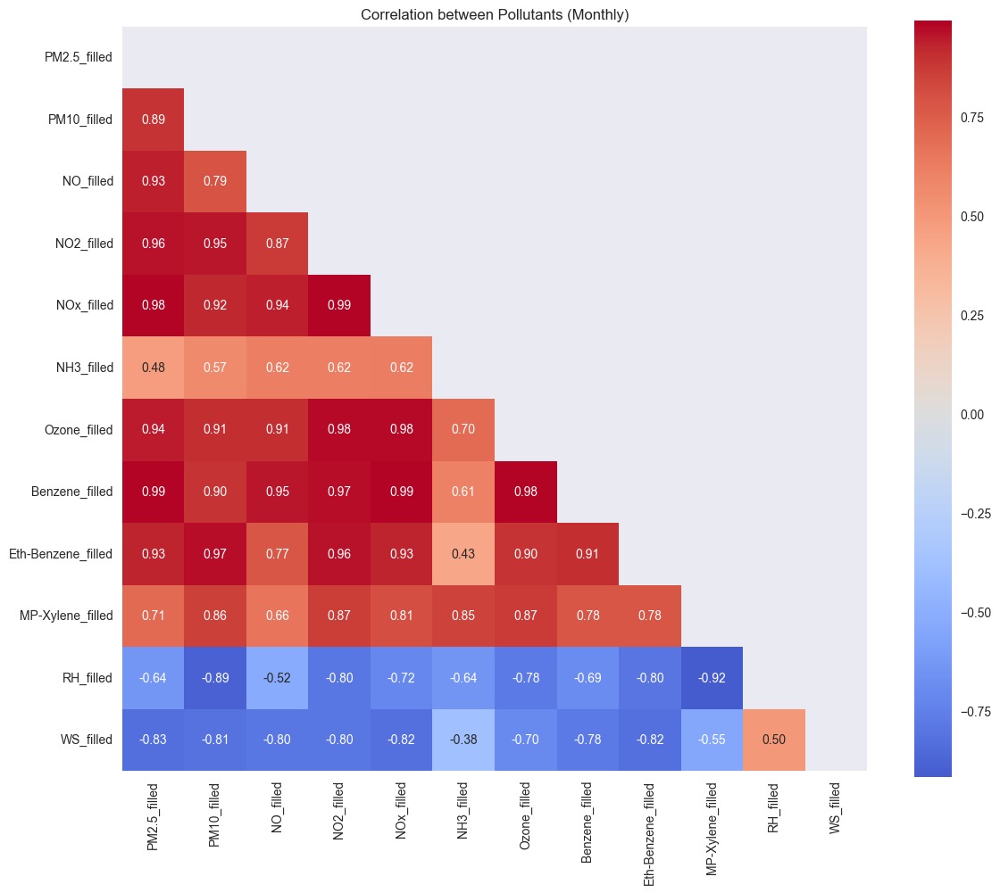


Pollutant Distributions:


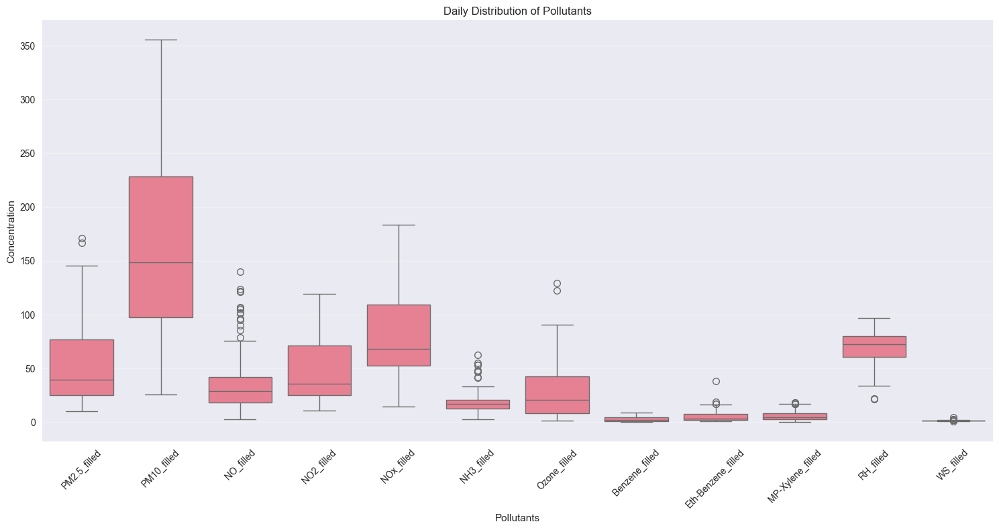

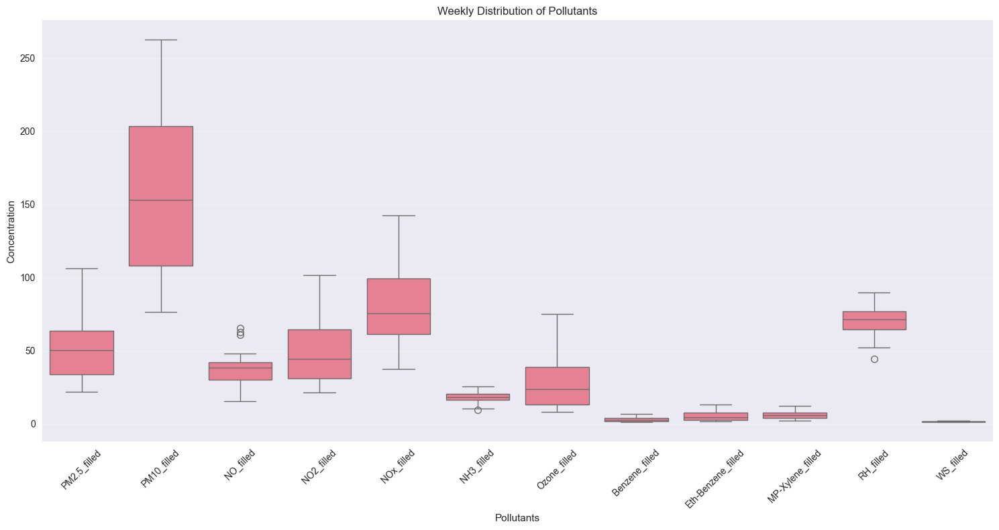

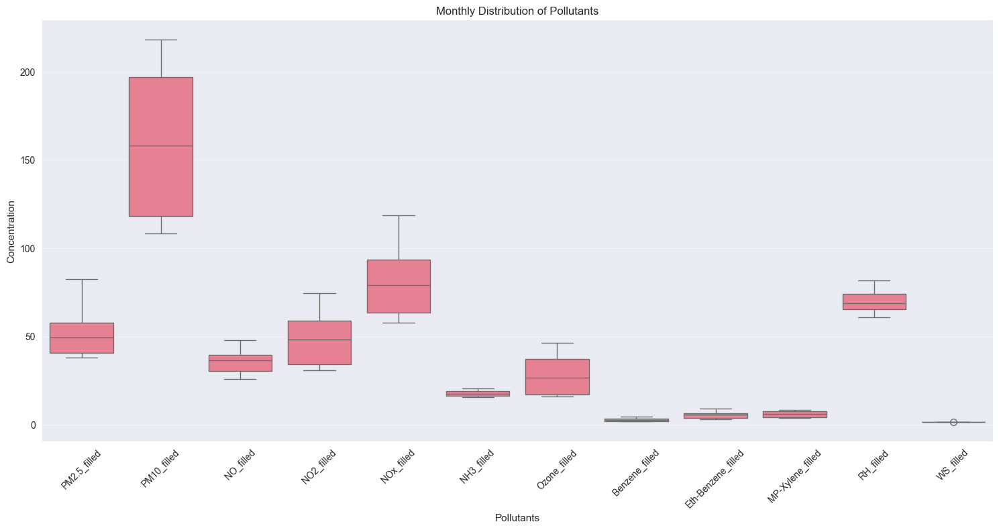

In [17]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.dates import DateFormatter

# Set style for visualizations
plt.style.use('seaborn')
sns.set_palette("husl")

# Read the CSV files
daily_data = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_daily.csv')
weekly_data = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_weekly.csv')
monthly_data = pd.read_csv('c:/Users/kunal/OneDrive/CODE FOR LIFE/AQI/DataPreprocessing/datasets/kurla_monthly.csv')

# Convert 'From Date' to datetime
daily_data['From Date'] = pd.to_datetime(daily_data['From Date'])
weekly_data['From Date'] = pd.to_datetime(weekly_data['From Date'])
monthly_data['From Date'] = pd.to_datetime(monthly_data['From Date'])

# Set 'From Date' as index
daily_data.set_index('From Date', inplace=True)
weekly_data.set_index('From Date', inplace=True)
monthly_data.set_index('From Date', inplace=True)

# Function to create trend plots
def plot_trends(data, title):
    plt.figure(figsize=(15, 8))
    
    for column in data.columns:
        if '_filled' in column:
            pollutant = column.replace('_filled', '')
            # Convert to numpy arrays before plotting
            dates = data.index.values
            values = data[column].values
            plt.plot(dates, values, '-', linewidth=2, label=pollutant)
    
    plt.title(f'{title} Trends of Air Pollutants')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.gca().xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    plt.tight_layout()
    plt.show()

# Function to create correlation heatmaps
def plot_correlation_heatmap(data, title):
    plt.figure(figsize=(12, 10))
    columns = [col for col in data.columns if '_filled' in col]
    correlation = data[columns].corr()
    
    mask = np.triu(np.ones_like(correlation, dtype=bool))
    sns.heatmap(correlation, mask=mask, annot=True, cmap='coolwarm', 
                center=0, fmt='.2f', square=True)
    plt.title(f'Correlation between Pollutants ({title})')
    plt.tight_layout()
    plt.show()

# Plot trends for each time period
print("Daily Trends:")
plot_trends(daily_data, 'Daily')

print("\nWeekly Trends:")
plot_trends(weekly_data, 'Weekly')

print("\nMonthly Trends:")
plot_trends(monthly_data, 'Monthly')

# Plot correlation heatmaps
print("\nCorrelation Heatmaps:")
plot_correlation_heatmap(daily_data, 'Daily')
plot_correlation_heatmap(weekly_data, 'Weekly')
plot_correlation_heatmap(monthly_data, 'Monthly')

# Create boxplots for each pollutant
def plot_boxplots(data, title):
    columns = [col for col in data.columns if '_filled' in col]
    plt.figure(figsize=(15, 8))
    
    data_melted = pd.melt(data.reset_index(), value_vars=columns)
    sns.boxplot(x='variable', y='value', data=data_melted)
    
    plt.title(f'{title} Distribution of Pollutants')
    plt.xticks(rotation=45)
    plt.xlabel('Pollutants')
    plt.ylabel('Concentration')
    plt.tight_layout()
    plt.show()

print("\nPollutant Distributions:")
plot_boxplots(daily_data, 'Daily')
plot_boxplots(weekly_data, 'Weekly')
plot_boxplots(monthly_data, 'Monthly')